# 221205 Day70

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import keras
from keras import Sequential
from keras import layers
from keras import optimizers
from keras.layers import Input, Dense

In [3]:
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Input, Rescaling, Conv2D, MaxPooling2D, Dense, Flatten

In [4]:
### 이미지를 훈련, 검증, 테스트 디렉터리로 복사하기
import os, shutil, pathlib

original_dir = pathlib.Path("cats-vs-dogs_original")   #원본 데이터셋이 압축 해제되어있는 디렉터리 경로
new_base_dir = pathlib.Path("cats_vs_dogs_small")      #서브셋 데이터를 저장할 디렉터리

def make_subset(subset_name, start_index, end_index):
    for category in ("cat", "dog"):
        dir = new_base_dir / subset_name / category
        os.makedirs(dir)
        fnames = [f"{category}.{i}.jpg" for i in range(start_index, end_index)]
        for fname in fnames:
            shutil.copyfile(src=original_dir / fname,
                            dst=dir / fname)

In [6]:
make_subset("train", start_index=0, end_index=1000)     #클래스 마다 훈련세트 1000개
make_subset("validation", start_index=1000, end_index=1500)    #클래스 마다 검증세트 500개
make_subset("test", start_index=1500, end_index=1999)   #클래스 마다 테스트세트 500개

In [7]:
### 강아지 vs 고양이 분류를 위한 소규모 컨브넷 만들기

inputs = keras.Input(shape=(180,180,3))   #180x180 크기의 RGB 이미지

x = layers.Rescaling(1./255)(inputs)   #입력을 255로 나누어 0~1 범위로 스케일 조정
x = layers.Conv2D(filters=32, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu')(x)
x = layers.Flatten()(x)

outputs = layers.Dense(units=1, activation='sigmoid')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(loss = 'binary_crossentropy',
             optimizer='rmsprop',
             metrics='accuracy')

In [8]:
### image_dataset_from_directory 를 사용하여 이미지 읽기
from tensorflow.keras.utils import image_dataset_from_directory

train_dataset = image_dataset_from_directory(   #제너레이터가 들어 있음
    new_base_dir / 'train',
    image_size=(180,180),
    batch_size=32)

validation_dataset = image_dataset_from_directory(
    new_base_dir / 'validation',
    image_size=(180,180),
    batch_size=32)

test_dataset = image_dataset_from_directory(
    new_base_dir / 'test',
    image_size=(180,180),
    batch_size=32)

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.
Found 998 files belonging to 2 classes.


## 8-3. 사전 훈련된 모델 활용하기
적은 이미지 데이터셋에 딥러닝을 적용하는 일반적이면서 매우 효과적인 방법은<br>
'사전 훈련된 모델' 을 사용하는 것이다<br>

'사전 훈련된 모델(pretrained model)' 은<br>
일반적으로 대규모 이미지 분류 문제를 위해 대량의 데이터셋에서 '미리 훈련된' 모델이며,<br>
학습된 특성을 다른 문제에 적용할 수 있는 유연성이 있다<br>
대부분 동물이나 생활용품으로 이루어진 ImageNet 데이터셋에 모델을 훈련하고, 이 모델을<br>
이미지에서 가구 아이템을 식별하는 용도로 사용할 수도 있는 것이다<br>

사전 훈련된 모델을 사용하는 방법에는 두가지가 있다<br>
--> 특성 추출 (feature extraction) 과 미세조정 (fine tuning)

### (1) Fully Connected 만 사용하기 (특성 추출)
새로운 데이터셋에 기존 컨브넷을 쉽게 재사용할 수 있는 방식으로,<br>
작은 이미지 데이터셋으로 작업할 때 효과적인 기법이다<br>

사전에 학습된 모델의 표현을 사용하여 새로운 샘플에서 흥미로운 특성을 뽑아내는 것<br>
이런 특성을 사용하여 새로운 분류기를 처음부터 훈련한다<br>

컨브넷의 경우 특성 추출은 사전에 훈련된 모델의 합성곱 기반 층(conv)을 선택하여<br>
새로운 데이터를 통과시키고, 그 출력으로 새로운 분류기를 훈련한다<br>

* 합성곱 층(conv)만 재사용하는 이유 (밀집 연결 분류기(Dense)는 재사용 하지 않는 이유)<br>
합성곱 층에 의해 학습된 표현이 더 일반적이어서 재사용이 가능하다

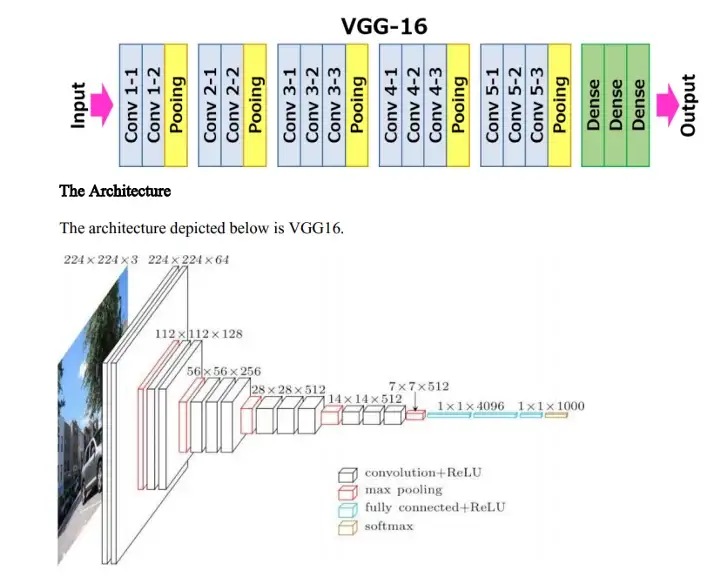

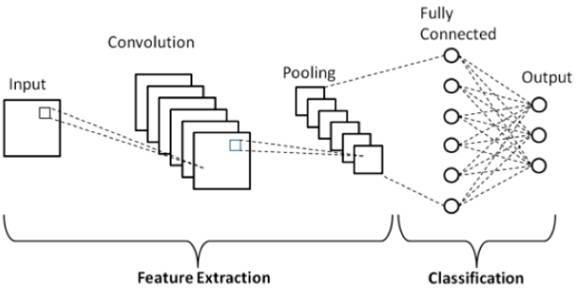

In [9]:
### VGG16 합성곱 기반 층 만들기
conv_base = keras.applications.vgg16.VGG16(   #학습된 파일을 가져온다
    weights = "imagenet",   # 모델을 초기화할 가중치 체크포인트 지정
    include_top = False,    # 밀집 연결 분류기 포함 여부 결정
    input_shape = (180, 180, 3))   #네트워크에 주입할 이미지 텐서의 크기 (선택사항)

In [10]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 180, 180, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 180, 180, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 90, 90, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 90, 90, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 90, 90, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 45, 45, 128)       0     

#### ① 데이터 증식을 사용하지 않는 빠른 특성 추출
새로운 데이터셋에서 합성곱 기반 층(conv)을 실행하고, 출력을 넘파이 배열로 저장한다<br>
그다음 이 데이터를 독립된 밀집 연결 분류기(Dense)에 입력으로 사용한다<br>
이 방식은 모든 입력 이미지에 대해 합성곱 기반 층을 '한번만' 실행하면 되기 때문에<br>
빠르고 비용이 적게 들지만, 데이터 증식을 사용할 수 없다

In [11]:
### VGG16 특성과 해당 레이블 추출하기
def get_features_and_labels(dataset):
    all_features = []
    all_labels = []
    for images, labels in dataset:
        preprocessed_images = keras.applications.vgg16.preprocess_input(images)
        features = conv_base.predict(preprocessed_images)   #conv 층의 결과물 출력 (넘파이 배열로 특성 추출)
        all_features.append(features)
        all_labels.append(labels)
    
    return np.concatenate(all_features), np.concatenate(all_labels)

train_features, train_labels = get_features_and_labels(train_dataset)
val_features, val_labels = get_features_and_labels(validation_dataset)
test_features, test_labels = get_features_and_labels(test_dataset)

1/1 [==============================] - 0s 446ms/step


중요한 점은 predict() 메서드가 레이블은 제외하고 이미지만 기대한다는 것이다<br>
하지만 현재 데이터셋은 이미지와 레이블을 함께 담고 있는 배치를 반환한다<br>
또한 VGG16 모델은 적절한 범위로 픽셀 값을 조정해주는<br>
keras.applications.vgg16.preprocess_input 함수로 전처리된 입력을 기대한다

In [12]:
## 추출된 특성의 크기 확인
train_features.shape

(2000, 5, 5, 512)

In [13]:
### 밀집 연결 분류기 정의하고 훈련하기
inputs = keras.Input(shape=(5, 5, 512))

x = layers.Flatten()(inputs)   # Dense 층에 특성을 주입하기 전에 Flatten 층 사용
x = layers.Dense(units=256)(x)
x = layers.Dropout(0.5)(x)

outputs = layers.Dense(units=1, activation='sigmoid')(x)

model = keras.Model(inputs, outputs)
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath="feature_extraction.keras",
      save_best_only=True,
      monitor="val_loss")
]

history = model.fit(
    train_features, train_labels,
    epochs=20,
    validation_data=(val_features, val_labels),
    callbacks=callbacks)

Epoch 1/20
63/63 [==============================] - 3s 38ms/step - loss: 19.1913 - accuracy: 0.9250 - val_loss: 14.3370 - val_accuracy: 0.9290
Epoch 2/20
63/63 [==============================] - 2s 37ms/step - loss: 2.7821 - accuracy: 0.9760 - val_loss: 7.3812 - val_accuracy: 0.9610
Epoch 3/20
63/63 [==============================] - 2s 37ms/step - loss: 1.6069 - accuracy: 0.9860 - val_loss: 5.2276 - val_accuracy: 0.9690
Epoch 4/20
63/63 [==============================] - 2s 35ms/step - loss: 1.2291 - accuracy: 0.9910 - val_loss: 10.5878 - val_accuracy: 0.9590
Epoch 5/20
63/63 [==============================] - 2s 37ms/step - loss: 1.5262 - accuracy: 0.9875 - val_loss: 4.8223 - val_accuracy: 0.9690
Epoch 6/20
63/63 [==============================] - 2s 38ms/step - loss: 0.4593 - accuracy: 0.9940 - val_loss: 4.2508 - val_accuracy: 0.9810
Epoch 7/20
63/63 [==============================] - 2s 34ms/step - loss: 0.7595 - accuracy: 0.9965 - val_loss: 5.3736 - val_accuracy: 0.9750
Epoch 8/20

In [14]:
### 테스트 세트에서 모델 평가
test_model = keras.models.load_model('feature_extraction.keras')  #저장된 것 불러오기
test_loss, test_acc = test_model.evaluate(test_features, test_labels)  #feature 와 label 이 들어간다
print('테스트 정확도:', np.round(test_acc, 3))

32/32 [==============================] - 0s 4ms/step - loss: 5.2855 - accuracy: 0.9719
테스트 정확도: 0.972


#### ② 데이터 증식을 사용한 특성 추출
준비한 모델(conv_base) 위에 Dense 층을 쌓아 확장한다<br>
그다음 입력 데이터에서 엔드-투-엔드 로 전체 모델을 실행한다<br>
모델에 노출된 모든 입력 이미지가 '매번' 합성곱 기반층을 통과하기 때문에<br>
데이터 증식을 사용할 수 있지만, 비용이 많이 든다

이 방법을 사용하기 위해서는 먼저 '합성곱 기반 층을 동결(고정)' 해야 한다<br>

하나 이상의 층을 '동결(freezing)' 한다는 것은 훈련하는 동안<br>
가중치가 업데이트 되지 않도록 막는다 는 뜻이다<br>
이렇게 하지 않으면 합성곱 기반 층에 의해 사전에 학습된 표현이 훈련하는 동안 수정될 수 있다<br>

케라스에서는 trainable 속성을 False 로 설정하여 층이나 모델을 동결할 수 있다

In [15]:
### VGG16 합성곱 기반 층을 만들고 동결하기
conv_base = keras.applications.vgg16.VGG16(
    weights='imagenet',
    include_top=False)

conv_base.trainable = False   #층이나 모델의 훈련 가능한 가중치 리스트가 텅 비게 된다

In [16]:
### 동결하기 전과 후에 훈련 가능한 가중치 리스트 출력
conv_base.trainable = True
print('합성곱 기반 층을 동결하기 전의 훈련 가능한 가중치 개수:',
     len(conv_base.trainable_weights))

conv_base.trainable = False
print('합성곱 기반 층을 동결한 후의 훈련 가능한 가중치 개수:',
     len(conv_base.trainable_weights))

합성곱 기반 층을 동결하기 전의 훈련 가능한 가중치 개수: 26
합성곱 기반 층을 동결한 후의 훈련 가능한 가중치 개수: 0


In [18]:
### 데이터 증식 단계와 밀집 분류기를 합성곱 기반 층에 추가하기

## 데이터 증식 단계
data_augmentation = keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.2)])

inputs = keras.Input(shape=(180,180,3))   #180x180 크기의 RGB 이미지

x = data_augmentation(inputs)   #데이터 증식 적용
x = keras.applications.vgg16.preprocess_input(x)   #입력 값의 스케일 조정
x = conv_base(x)    # 합성곱 기반층에 추가
x = layers.Flatten()(x)
x = layers.Dense(units=256)(x)
x = layers.Dropout(0.5)(x)

outputs = layers.Dense(units=1, activation='sigmoid')(x)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(loss = 'binary_crossentropy',
             optimizer='rmsprop',
             metrics='accuracy')

변경 사항을 적용하려면 먼저 모델을 컴파일 해야한다<br>
컴파일 단계 후에 trainable 속성을 변경하면, 반드시 모델을 다시 컴파일 해야 한다<br>
그렇지 않으면 변경사항이 저장되지 않는다

In [19]:
### 모델 훈련

callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath="feature_extraction_with_data_augmentation.keras",
      save_best_only=True,
      monitor="val_loss")
]

history = model.fit(
    train_dataset,
    epochs=50,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/50
63/63 [==============================] - 234s 4s/step - loss: 22.6915 - accuracy: 0.8890 - val_loss: 5.6580 - val_accuracy: 0.9660
Epoch 2/50
63/63 [==============================] - 227s 4s/step - loss: 5.8458 - accuracy: 0.9540 - val_loss: 25.6146 - val_accuracy: 0.9000
Epoch 3/50
63/63 [==============================] - 228s 4s/step - loss: 4.6412 - accuracy: 0.9605 - val_loss: 10.2731 - val_accuracy: 0.9480
Epoch 4/50
63/63 [==============================] - 226s 4s/step - loss: 3.9431 - accuracy: 0.9645 - val_loss: 4.8209 - val_accuracy: 0.9760
Epoch 5/50
63/63 [==============================] - 229s 4s/step - loss: 3.8354 - accuracy: 0.9685 - val_loss: 4.3939 - val_accuracy: 0.9710
Epoch 6/50
63/63 [==============================] - 229s 4s/step - loss: 2.3963 - accuracy: 0.9745 - val_loss: 3.8226 - val_accuracy: 0.9740
Epoch 7/50
63/63 [==============================] - 228s 4s/step - loss: 3.0054 - accuracy: 0.9720 - val_loss: 5.4349 - val_accuracy: 0.9690
Epoch 8/50

In [ ]:
### 테스트 세트에서 모델 평가
test_model = keras.models.load_model(
    "feature_extraction_with_data_augmentation.keras")

test_loss, test_acc = test_model.evaluate(test_dataset)
print('테스트 정확도:', np.round(test_acc, 3))

### (2) Conv층 일부 사용하기 (미세 조정, Fine Tuning)
conv 층의 일부는 사용자가 직접 훈련 시킨다 (미세 조정)<br>

특성 추출을 보완하기 위해 '미세 조정' 을 사용한다<br>
기존 모델에서 사전에 학습한 표현의 일부를 새로운 문제에 적응시킨다<br>

특성 추출에 사용했던 동결 모델의 상위 층 몇개를 동결에서 해제하고<br>
모델에 새로 추가한 층(예: 밀집 연결 분류기(Dense))과 함께 훈련하는 것<br>

주어진 문제에 조금 더 밀접하게 재사용 모델의 표현을 일부 조정하기 때문에<br>
'미세 조정' 이라고 부른다

#### * 미세조정 실행 단계
① 사전에 훈련된 기반 네트워크 위에 새로운 네트워크 추가<br>
② 기반 네트워크 동결<br>
③ 새로 추가한 네트워크 훈련<br>
④ 기반 네트워크에서 일부 층의 동결 해제<br>
⑤ 동결을 해제한 층과 새로 추가한 층을 함께 훈련

#### * 더 많은 층을 미세 조정하지 않는 이유
- 합성곱 기반 층(conv) 에 있는 '하위 층' 들은 좀 더 일반적이고 재사용 가능한 특성들을 인코딩한다<br>
반면 '상위 층' 들은 조금 더 '특화된 특성' 을 인코딩 한다<br>
새로운 문제에 재활용하도록 수정이 필요한 것은 구체적인 특성이므로, 상위 층을 미세 조정하는 것이 좋다<br>
하위 층으로 갈수록 미세 조정에 대한 효과가 감소한다<br>

- 훈련해야할 파라미터가 많을수록 과대적합의 위험이 커진다<br>
합성곱 기반 층은 1,500 만 개의 파라미터를 갖고 있어 작은 데이터셋으로 전부 훈련하는 것은 매우 위험하다<br>
따라서 합성곱 기반 층에서 최상위 2~3개의 층만 미세조정하는 것이 좋다

In [ ]:
conv_base.summary()

In [ ]:
### 마지막에서 4번째 층까지 모든 층 동결
conv_base.trainable = True
for layer in conv_base.layer[:-4]:
    layer.trainable = False     #뒤에서 4개 층은 동결

In [ ]:
### 모델 미세 조정하기
## 학습률을 낮춘 RMSprop 옵티마이저 사용
# 미세 조정하는 3개의 층에서 학습된 표현을 조금씩 수정하기 위해
# (변경량이 너무 크면 학습된 표현에 나쁜 영향을 끼칠 수 있다)

model.compile(loss = 'binary_crossentropy',
             optimizer=keras.optimizers.RMSprop(learning_rate=1e-5),
             metrics='accuracy')

callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath="fine_tuning.keras",
      save_best_only=True,
      monitor="val_loss")
]

history = model.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=callbacks)

In [ ]:
### 테스트 데이터에서 모델 평가
model = keras.models.load_model("fine_tuning.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print('테스트 정확도:', np.round(test_acc, 3))

## 9-1. 세가지 주요 컴퓨터 비전 작업
① 이미지 분류 (image classification) :<br>
이미지에 하나 이상의 레이블을 할당하는 것<br>
단일 레이블 분류 또는 다중 레이블 분류<br>

② 이미지 분할 (image segmentation) :<br>
이미지를 다른 영역으로 나누거나 분할하는 것<br>
각 영역은 일반적으로 하나의 범주를 나타냄<br>

③ 객체 탐지 (object detection) :<br>
이미지에 있는 관심 객체 주변에<br>
바운딩 박스 (bounding box) 라고 불리는 사각형을 그리는 것<br>
각 사각형은 하나의 클래스에 연관됨<br>

이외에도 여러가지 작업이 있다<br>
이미지 유사도 평가, 키포인트 감지, 포즈 추정, 3D 메시 추정 등

## 9-2. 이미지 분할 예제 (Colab 에서 실행)
딥러닝을 사용한 이미지 분할은 모델을 사용하여 이미지 안의 각 '픽셀' 에 클래스를 할당하는 것이다<br>
즉 이미지를 여러 다른 영역으로 분할한다<br>

① 시멘틱 분할 (semantic segmentation) :<br>
각 픽셀이 독립적으로 'cat' 과 같은 '하나의 의미' 를 가진 범주로 분류됨<br>

② 인스턴스 분할 (instance segmentation) :<br>
이미지 픽셀을 범주로 분류하는 것 뿐만 아니라 개별 객체 인스턴스를 구분함

In [ ]:
### 데이터셋 내려받고 압축 풀기
## 데이터 내려받기
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/images.tar.gz
!wget http://www.robots.ox.ac.uk/~vgg/data/pets/data/annotations.tar.gz

## 압축 풀기
!tar -xvf images.tar.gz
!tar -xvf annotations.tar.gz 

입력 사진은 images/ 폴더에 JPG 파일로 저장되어 있으며,<br>
이에 해당하는 분할 마스크는 annotations/trimaps/ 폴더에 같은 이름의 PNG 파일로 저장되어 있다

In [ ]:
### 입력 파일 경로 리스트와 분할 마스크 파일 경로 리스트
import os

input_dir = "images/"
target_dir = "annotations/trimaps/"

input_img_paths = sorted(               # sorted() : 정렬
    [os.path.join(input_dir, fname)     # fname : 파일 이름
     for fname in os.listdir(input_dir)
     if fname.endswith(".jpg")])    # endswith() : ~로 끝나는

target_paths = sorted(
    [os.path.join(target_dir, fname)
     for fname in os.listdir(target_dir)
     if fname.endswith(".png") and not fname.startswith(".")]) 

In [ ]:
input_img_paths

In [ ]:
### 입력과 분할 마스크 살펴보기 - 샘플 이미지
import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img, img_to_array

plt.axis('off')
plt.imshow(load_img(input_img_paths[9]))    #인덱스 9에 해당하는 입력 이미지 출력

In [ ]:
### 입력과 분할 마스크 살펴보기 - 분할 마스크(타깃)
def display_target(target_array):
    # 원래 레이블에서 1을 빼서 0~2 범위로 만들고,
    # 127을 곱해서 레이블 값을 0(검은색), 127(회색), 254(거의 흰색)으로 만든다
    normalized_array = (target_array - 1) * 127

    plt.axis("off")
    plt.imshow(normalized_array[:, :, 0])

# color_mode="grayscale" : 로드한 이미지를 하나의 컬러 채널이 있는 것처럼
img = img_to_array(load_img(target_paths[9], color_mode="grayscale"))
display_target(img)

In [ ]:
def display_target(target_array):
    normalized_array = (target_array.astype('uint8') - 1) * 127
    plt.axis("off")
    plt.imshow(normalized_array[:, :, 0])

img = img_to_array(load_img(target_paths[9], color_mode="grayscale"))
display_target(img)

In [ ]:
### 훈련 세트와 검증 세트 생성

import numpy as np
import random

img_size = (200, 200)   # 입력과 타깃의 크기 모두 200X200
num_imgs = len(input_img_paths)    # 데이터에 있는 전체 샘플 개수

# 파일 경로 섞기 (입력 경로와 타깃 경로가 동일한 순서를 유지하도록 같은 시드(1337) 사용)
random.Random(1337).shuffle(input_img_paths)
random.Random(1337).shuffle(target_paths)

def path_to_input_image(path):
    return img_to_array(load_img(path, target_size=img_size))

def path_to_target(path):
    img = img_to_array(
        load_img(path, target_size=img_size, color_mode="grayscale"))
    img = img.astype("uint8") - 1   # 레이블이 0,1,2 가 되도록 1을 뺀다
    return img


# 전체 이미지를 input_imgs 에 'float32' 배열로 로드 (3개의 채널을 가짐, RGB)
input_imgs = np.zeros((num_imgs,) + img_size + (3,), dtype="float32")

# 타깃 마스크는 targets 에 'uint8' 로드 (1개의 채널을 가짐)
targets = np.zeros((num_imgs,) + img_size + (1,), dtype="uint8")

for i in range(num_imgs):
    input_imgs[i] = path_to_input_image(input_img_paths[i])
    targets[i] = path_to_target(target_paths[i])


num_val_samples = 1000    # 검증에 1000 개의 샘플 사용
## 데이터를 훈련 세트와 검증 세트로 분리
train_input_imgs = input_imgs[:-num_val_samples]
train_targets = targets[:-num_val_samples]
val_input_imgs = input_imgs[-num_val_samples:]
val_targets = targets[-num_val_samples:] 

In [ ]:
## 차원 변경 (np.expand_dim, np.reshape, np.new_axis ...)
print((200, 200) + (3, ))
print((200, 200) + (3, 3))
print((5, ) + (200, 200) + (3, 3))

In [ ]:
### 모델 정의
from tensorflow import keras
from tensorflow.keras import layers

def get_model(img_size, num_classes):
    inputs = keras.Input(shape=img_size + (3,))
    x = layers.Rescaling(1./255)(inputs)     # 입력 이미지를 [0~1] 범위로 만듬
    
    # strides=2 : 크기를 반으로 축소 (다운샘플링, maxpooling 역할)
    # padding="same" : 패딩이 특성 맵 크기에 영향을 미치지 않도록 모두 'same' 으로 지정
    x = layers.Conv2D(64, 3, strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
    x = layers.Conv2D(128, 3, strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2D(128, 3, activation="relu", padding="same")(x)
    x = layers.Conv2D(256, 3, strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2D(256, 3, activation="relu", padding="same")(x)
    
    # Transpose : 업샘플링 (역방향)
    x = layers.Conv2DTranspose(256, 3, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(256, 3, activation="relu", padding="same", strides=2)(x)
    x = layers.Conv2DTranspose(128, 3, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(128, 3, activation="relu", padding="same", strides=2)(x)
    x = layers.Conv2DTranspose(64, 3, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(64, 3, activation="relu", padding="same", strides=2)(x)
    
    # 각 출력 픽셀을 3개의 범주 중 하나로 분류하기 위해
    # 3개의 유닛과 softmax 활성화 함수를 가진 밀집 층으로 모델 종료
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    model = keras.Model(inputs, outputs)

    return model

model = get_model(img_size=img_size, num_classes=3)
model.summary()

이 모델에서 처음 절반의 목적은 이미지를 작은 특성 맵으로 인코딩 하는 것이다<br>
공간상의 각 위치(픽셀)는 원본 이미지에 있는 더 큰 영역에 대한 정보를 담고 있으며,<br>
이를 일종의 '압축' 으로 이해할 수 있다<br>

여기에서는 MaxPooling2D 층을 사용하지 않고,<br>
합성곱 층 마다 '스트라이드(stride)' 를 추가하여 다운샘플링 하였다<br>
이미지 분할의 경우 모델의 출력으로 픽셀별 타깃 마스크를 생성해야 하므로<br>
정보의 '공간상 위치' 에 많은 관심을 두기 때문이다<br>

MaxPooling2D 을 사용하면 풀링 윈도우 안의 위치 정보가 '완전히 삭제' 된다<br>
스트라이드 합성곱은 위치 정보를 '유지' 하면서 특성 맵을 다운샘플링 하는 작업에 더 잘 맞는다<br>

이 모델의 나머지 절반은 Conv2DTranspose 층을 쌓은 것이다<br>
모델의 최종 출력은 타깃 마스크의 크기인 (200, 200, 3) 과 동일해야하므로,<br>
적용한 변환을 거꾸로 적용할 필요가 있는 것이다<br>
즉 다운샘플링이 아니라 특성 맵을 '업샘플링' 하는 것이다

In [ ]:
### 모델 컴파일 & 훈련
model.compile(optimizer="rmsprop", loss="sparse_categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("oxford_segmentation.keras",
                                    save_best_only=True)
]

history = model.fit(train_input_imgs, train_targets,
                    epochs=50,
                    callbacks=callbacks,
                    batch_size=64,
                    validation_data=(val_input_imgs, val_targets)) 

In [ ]:
### 훈련과 검증 손실 그래프
epochs = range(1, len(history.history["loss"]) + 1)
loss = history.history["loss"]
val_loss = history.history["val_loss"]

plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [ ]:
### 검증 손실을 기준으로 최상의 모델을 다시 로드하여 분할 마스크 예측
from tensorflow.keras.utils import array_to_img

model = keras.models.load_model("oxford_segmentation.keras")

i = 4
test_image = val_input_imgs[i]
plt.axis("off")
plt.imshow(array_to_img(test_image))

mask = model.predict(np.expand_dims(test_image, 0))[0]   #np.expand_dims() : 차원 증가

# 모델 예측 출력 함수
def display_mask(pred):
    mask = np.argmax(pred, axis=-1)
    mask *= 127
    plt.axis("off")
    plt.imshow(mask)

display_mask(mask)

## 9-3. 최신 컨브넷 아키텍처 패턴
모델의 '아키텍처 (architecture)' 는 모델을 만드는 데 사용된 일련의 선택으로, <br>사용할 층, 층의 설정, 층을 연결하는 방법 등에 해당한다<br>

이런 선택 모델의 '가설 공간' 을 정의한다<br>
좋은 가설 공간은 현재 문제와 솔루션에 대한 '사전 지식' 을 인코딩한다<br>
데이터에서 효율적으로 학습하기 위해 찾고 있는 것에 대한 가정을 해야한다<br>

좋은 모델 아키텍처는 탐색 공간의 크기를 줄이거나 탐색 공간의 좋은 위치에 쉽게 수렴할 수 있는 구조이다<br>
경사하강법이 해결할 문제를 간단하게 만드는 것이다

### (1) 모듈화, 계층화 그리고 재사용
복잡한 시스템을 단순하게 만드는 방법<br>
'아키텍처' 라는 용어가 사용되는 모든 영역에 있는 시스템 구조의 기초가 되며,<br>
의미 있는 복잡성을 가진 모든 시스템 조직의 핵심이다<br>
(복잡한 시스템은 계층적 구조를 따르고, 여러번 재사용되는 고유한 모듈로 구성된다)<br>

효율적인 코드는 모듈화되고 계층적이며, 동일한 것을 두 번 구현하지 않는다<br>
그 대신 재사용 가능한 클래스와 함수를 사용한다<br>

딥러닝 모델 아키텍처는 '모듈화, 계층화, 재사용' 을 활용하는 것이다<br>
인기 있는 모든 컨브넷 아키텍처를 층으로만 구성되어 있지 않고<br>
반복되는 층 그룹 ('블록 또는 모듈') 으로 구성되어 있다<br>
또한 대부분의 컨브넷은 '피라미드' 와 같은 '계층 구조' 를 갖는 경우가 많다<br>
합성곱의 필터 개수는 층이 깊어질수록 늘어나지만, 특성 맵의 크기는 줄어든다<br>

일반적으로 작은 층을 깊게 쌓은 모델이 큰 층을 얇게 쌓은 것보다 성능이 좋지만,<br>
'그레디언트 소실' 문제 때문에 층을 쌓을 수 있는 정도에 한계가 있다

### (2) 잔차 연결
'그레디언트 소실 (vanishing gradient)'<br>
함수 연결이 너무 깊으면 이 잡음이 그레디언트 정보를 압도하기 시작하고, 역전파가 동작하지 않게 된다<br>
즉 모델이 전혀 훈련되지 않게 되는 것이다<br>

해결 방법은 이전 입력에 담긴 잡음 없는 정보를 유지시키는 것이며, 이를 구현하는 가장 쉬운 방법이 '잔차 연결' 이다<br>
층이나 블록의 입력을 출력에 더하기만 하면 되는 방법이다

In [ ]:
### 잔차 연결 코드
x = ...     # 입력 텐서
residual = x     # 원본 입력을 별도로 저장 (= 잔차)
x = block(x)
x = add([x, residual])    #원본 입력을 층의 출력에 더한다 (따라서 최종 출력은 항상 원본 입력의 전체 정보를 보존한다)

입력을 블록의 출력에 다시 더한다는 것은 출력의 크기가 입력의 크기와 같아야 한다는 것을 의미한다<br>

블록에 필터 개수가 늘어난 합성곱 층이나 최대 풀링 층이 들어있는 경우에는<br>
활성화 함수가 없는 1x1 Conv2D 층을 사용하여 잔차를 원하는 출력 크기로, 선형적으로 투영할 수 있다<br>

블록에 있는 합성곱 층은 '패딩' 때문에 공간 방향으로 다운샘플링 되지 않도록 일반적으로 ' padding = "same" ' 을 사용한다<br>
또는 MaxPooling 층으로 인한 다운샘플링에 맞추기 위해 잔차 투영에 '스트라이드' 를 사용할 수도 있다

In [ ]:
### 필터 개수가 변경되는 잔차 블록
from tensorflow import keras
from tensorflow.keras import layers

inputs = keras.Input(shape=(32, 32, 3))
x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(inputs)
residual = x     # 잔차를 따로 저장함
x = layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding="same")(x)     #출력 필터를 32에서 64로 증가시킴, padding="same" : 패딩으로 인해 다운샘플링 되지 않도록함
residual = layers.Conv2D(filters=64, kernel_size=1)(residual)    # 잔차는 32개의 필터만 있으므로 1x1 Conv2D 를 사용하여 적절한 크기로 투영
x = layers.add([x, residual])    # 블록 출력과 잔차의 크기가 같아 더할 수 있다

In [ ]:
### MaxPooling 층을 가진 잔차 블록
inputs = keras.Input(shape=(32, 32, 3))
x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(inputs)
residual = x     # 잔차를 따로 저장함
x = layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding="same")(x)
x = layers.MaxPooling2D(pool_size=2, padding="same")(x)
residual = layers.Conv2D(filters=64, kernel_size=1, strides=2)(residual)    # MaxPooling 층으로 인한 다운샘플링에 맞추기 위해 잔차 투영에 strides=2 사용
x = layers.add([x, residual])

In [ ]:
### 여러개의 블록으로 구성된 간단한 컨브넷
inputs = keras.Input(shape=(32, 32, 3))
x = layers.Rescaling(1./255)(inputs)

# 잔차 연결을 가진 합성곱 블록을 적용하는 함수, 선택적으로 최대 폴링 추가
def residual_block(x, filters, pooling=False):
    residual = x
    x = layers.Conv2D(filters = filters, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.Conv2D(filters = filters, kernel_size=3, activation="relu", padding="same")(x)
    
    if pooling:
        x = layers.MaxPooling2D(pool_size=2, padding="same")(x)
        residual = layers.Conv2D(filters=filters, kernel_size=1, strides=2)(residual)    # MaxPooling 을 사용하면 잔차를 원하는 크기로 투영하기 위해 stride 합성곱 추가
    elif filters != residual.shape[-1]:
        residual = layers.Conv2D(filters=filters, kernel_size=1)(residual)    # MaxPooling 을 사용하지 않으면 채널 수가 바뀐 경우에만 잔차 투영

    x = layers.add([x, residual])

    return x


x = residual_block(x, filters=32, pooling=True)     # 첫번째 블록
x = residual_block(x, filters=64, pooling=True)     # 두번째 블록 (필터 개수 증가)
x = residual_block(x, filters=128, pooling=False)   # 마지막 블록
x = layers.GlobalAveragePooling2D()(x)

outputs = layers.Dense(units=1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)
model.summary()

잔차 연결을 사용하면 그레디언트 소실에 대해 걱정하지 않고 원하는 깊이의 네트워크를 만들 수 있다

#### * 그레디언트 소실 (기울기 소실)
https://heytech.tistory.com/388

### (3) 배치 정규화
'정규화 (normalization)'<br>
머신 러닝 모델에 주입되는 샘플들을 '균일하게' 만드는 광범위한 방법<br>

지금까지는 모델에 데이터를 주입하기 전에 정규화를 했지만, 데이터 정규화는 네트워크에서 일어나는 모든 변환 후에도 필요할 수 있다<br>
Dense 나 Conv2D 층에 들어가는 데이터의 평균이 0 이고, 분산이 1 이더라도, 출력되는 데이터가 동일한 분포를 가질 것이라고 기대하기는 어렵기 때문이다<br>

'배치 정규화 (batch normalization)' 은 훈련하는 동안 평균과 분산이 바뀌더라도, 이에 적응하여 데이터를 정규화 하는 것이다<br>
훈련하는 동안 현재 배치 데이터의 평균과 분산을 사용하여 샘플을 정규화 한다<br>

배치 정규화의 주요 효과는 잔차 연결과 비슷하게 그레디언트의 전파를 도와준다<br>
결국 더 깊은 네트워크를 구성할 수 있게 하며, 매우 깊은 네트워크라면 여러개의 BatchNormalization 층을 포함해야 훈련할 수 있다<br>

BatchNormalization 층은 Dense, Conv2D 등을 포함하여 어떤 층 다음에도 사용할 수 있다

In [ ]:
x = ...
x = layers.Conv2D(filters=32, kernel_size=3, use_bias=False)(x)     #Conv2D 층의 출력이 정규화 되기 때문에 편향 벡터가 필요하지 않다
x = layers.BatchNormalization()(x)

Dense 층과 Conv2D 층은 모두 '편향 벡터' 를 가진다<br>
학습되는 이 변수는 층을 순수한 선형 변환이 아니라 아핀 변환으로 만드는 것이 목적이다<br>

Conv2D 는 y = conv(x, kernel) + bias 를 반환하고,<br>
Dense 는 y = dot(x, kernel) + bias 를 반환한다<br>

정규화 단계는 총 출력의 평균을 '0' 에 맞추기 때문에 BatchNormalization 층을 사용할 때 편향 벡터가 더이상 필요하지 않다<br>
use_bias = False 옵션을 사용하면 편향을 제외한 층을 만들 수 있으며, 이는 층을 약간 더 가볍게 한다

In [ ]:
### 배치 정규화 사용법 : 활성화 층이 마지막에 온다
x = layers.Conv2D(filters=32, kernel_size=3, use_bias=False)(x)     # 활성화 함수를 지정하지 않는다
x = layers.BatchNormalization()(x)
x = layers.Activation("relu")(x)     # BatchNormalization 층 다음에 활성화 함수를 놓는다

활성화 함수를 BatchNormalization 층 다음에 놓는 이유는<br>
배치 정규화는 입력 평균을 '0' 으로 만들고, relu 활성화 함수는 0 을 기준으로 값을 통과시키거나 삭제하기 때문이다<br>
따라서 활성화 함수 이전에 정규화를 수행하면 relu 함수의 활용도가 극대화된다<br>

* 배치 정규화와 미세 조정<br>
BatchNormalization 층이 있는 모델을 미세 조정할 때는 이 층들을 동결하는 것이 좋다 (trainable = False 로 설정)<br>
그렇지 않으면 내부 평균과 분산이 계속 업데이트 되어 Conv2D 층에 적용할 경우 매우 작은 업데이트를 방해할 수 있다

# 221206 Day71

### (4) 깊이별 분리 합성곱
'깊이별 분리 합성곱' 층은 케라스에서는 SeparableConv2D 에 구현되어 있으며,<br>
입력 채널별로 독립적으로 공간 방향의 합성곱을 수행하고, 점별 합성곱 (1X1 합성곱) 을 통해 출력 채널을 합친다<br>
이는 공간 특성의 학습과 채널 방향 특성의 학습을 분리하는 효과를 준다<br>
중간 활성화에 있는 공간상의 위치가 높은 상관관계를 가지지만 채널 간에는 매우 독립적이라는 가정에 의존한다<br>

깊이별 분리 합성곱은 일반 합성곱 보다 훨씬 적은 개수의 파라미터를 사용하고<br>
더 적은 수의 연산을 수행하면서 유사한 표현 능력을 가지고 있다<br>
이를 통해 수렴이 더 빠르고 쉽게 과대적합 되지 않는 작은 모델을 만들게 되며,<br>
이러한 장점은 제한된 데이터로 밑바닥부터 작은 모델을 훈련할 때 특히 중요하다<br>

대규모 모델에 적용된 사례로는 케라스에 포함된 고성능 컨브넷인 'Xception' 구조의 기반으로 깊이별 분리 합성곱이 사용되었다

### (5) Xception 유사 모델에 모두 적용하기

#### * 컨브넷 아키텍처 원칙 정리
- 모델은 반복되는 층 '블록 (conv + MaxPooling)' 으로 조직되어야 한다<br>
- feature map 공간 방향 크기가 줄어듦에 따라 층의 필터 개수는 증가해야한다<br>
- 깊고 좁은 아키텍처가 넓고 얇은 것 보다 낫다<br>
- 층 블록에 '잔차 연결' 을 추가하면 깊은 네트워크(layer) 를 훈련하는데 도움이 된다<br>
- 합성곱 층 다음에 '배치 정규화 층' 을 추가하면 도움이 된다<br>
- Conv2D 층 대신 파라미터 효율성이 더 좋은 SeparableConv2D (깊이별 분리 합성곱) 층으로 바꾸면 도움이 된다

In [ ]:
### 작은 버전의 Xception 모델
inputs = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)     # 데이터 증식 설정
x = layers.Rescaling(1./255)(x)   # 입력 데이터의 스케일 조정
x = layers.Conv2D(filters=32, kernel_size=5, use_bias=False)(x)   # 컬러 이미지 이므로 일반적인 Conv2D 층 적용

## 특성 맵의 깊이를 증가시키면서 합성곱 블록을 연속적으로 적용
for size in [32, 64, 128, 256, 512]:
    residual = x
    
    x = layers.BatchNormalization()(x)    # 배치 정규화
    x = layers.Activation("relu")(x)
    x = layers.SeparableConv2D(filters=size, kernel_size=3, padding='same', use_bias=False)(x)   # 깊이별 분리 합성곱
    
    x = layers.BatchNormalization()(x)    # 배치 정규화
    x = layers.Activation("relu")(x)
    x = layers.SeparableConv2D(filters=size, kernel_size=3, padding='same', use_bias=False)(x)
    
    x = layers.MaxPooling2D(pool_size=3, strides=2, padding='same')(x)
    
    residual = layers.Conv2D(
        filters=size, kernel_size=1, strides=2, padding='same', use_bias=False)(residual)
    x = layers.add([x, residual])
    
x = layers.GlobalAveragePooling2D()(x)   # Flatten 층 대신
x = layers.Dropout(0.5)(x)    # 규제 (과대적합 방지)

outputs = layers.Dense(units=1, activation='sigmoid')(x)

model = keras.Model(inputs, outputs)

## 9-4. 컨브넷이 학습한 것 해석하기
컨브넷의 표현은 시각적인 개념을 학습한 것이기 때문에 시각화하기에 좋다<br>

* 필터 하나의 크기 = (윈도우 크기 X 채널 크기 + 편향)

#### * 컨브넷 시각화 방법
- ① 중간층의 출력 (중간층에 있는 활성화) 을 시각화<br>
연속된 컨브넷 층이 입력을 어떻게 변형시키는지 이해하고 개별적인 컨브넷 필터의 의미를 파악하는데 도움이 된다<br>

- ② 컨브넷 필터 시각화<br>
컨브넷의 필터가 찾으려는 시각적인 패턴과 개념이 무엇인지 상세하게 이해하는 데 도움이 된다<br>

- ③ 클래스 활성화에 대한 히트맵을 이미지에 시각화<br>
어떤 클래스에 속하는데에 이미지의 어느 부분이 기여했는지를 이해하고 이미지에서 객체의 위치를 추청하는데 도움이 된다

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import keras
from keras import Sequential
from keras import layers
from keras import optimizers
from keras.layers import Input, Dense

In [3]:
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Input, Rescaling, Conv2D, MaxPooling2D, Dense, Flatten

#### * 8-2 에서의 코드

In [6]:
### image_dataset_from_directory 를 사용하여 이미지 읽기
import os, shutil, pathlib
from tensorflow.keras.utils import image_dataset_from_directory

new_base_dir = pathlib.Path("cats_vs_dogs_small")

train_dataset = image_dataset_from_directory(   #제너레이터가 들어 있음
    new_base_dir / 'train',
    image_size=(180,180),
    batch_size=32)

validation_dataset = image_dataset_from_directory(
    new_base_dir / 'validation',
    image_size=(180,180),
    batch_size=32)

test_dataset = image_dataset_from_directory(
    new_base_dir / 'test',
    image_size=(180,180),
    batch_size=32)

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.
Found 998 files belonging to 2 classes.


In [7]:
### 컨브넷에 추가할 데이터 증식 단계 정의
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),   #랜덤하게 50% 이미지를 수평으로 뒤집는다
    layers.RandomRotation(0.1),        #[-10%, +10%] 범위 안에서 랜덤한 값만큼 이미지 회전
    layers.RandomZoom(0.2)             #[-20%, +20%] 범위 안에서 랜덤한 비율만큼 이미지 확대 또는 축소
])

In [8]:
### 이미지 증식과 드롭아웃을 포함한 컨브넷
inputs = keras.Input(shape=(180,180,3))   #180x180 크기의 RGB 이미지

x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)   #입력을 255로 나누어 0~1 범위로 스케일 조정
x = layers.Conv2D(filters=32, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu')(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.5)(x)

outputs = layers.Dense(units=1, activation='sigmoid')(x)

model = keras.Model(inputs=inputs, outputs=outputs)

model.compile(loss = 'binary_crossentropy',
             optimizer='rmsprop',
             metrics='accuracy')

In [9]:
### 규제를 추가한 컨브넷 훈련하기
callbacks = [
    keras.callbacks.ModelCheckpoint(             # ModelCheckpoint : 에포크가 끝날 때마다 모델 저장
        filepath='convnet_from_scratch_with_augmentation.keras',   # 파일 저장 경로
        save_best_only=True,                     # val_loss 값이 이전보다 더 낮을 때만 저장
        monitor='val_loss')
]

history = model.fit(
    train_dataset,
    epochs=50,
    validation_data = validation_dataset,
    callbacks=callbacks)

Epoch 1/50
63/63 [==============================] - 70s 1s/step - loss: 0.7053 - accuracy: 0.5130 - val_loss: 0.7753 - val_accuracy: 0.5000
Epoch 2/50
63/63 [==============================] - 64s 1s/step - loss: 0.7085 - accuracy: 0.5250 - val_loss: 0.6800 - val_accuracy: 0.5720
Epoch 3/50
63/63 [==============================] - 64s 1s/step - loss: 0.6892 - accuracy: 0.5835 - val_loss: 0.6418 - val_accuracy: 0.6280
Epoch 4/50
63/63 [==============================] - 65s 1s/step - loss: 0.6942 - accuracy: 0.6060 - val_loss: 0.6467 - val_accuracy: 0.6290
Epoch 5/50
63/63 [==============================] - 66s 1s/step - loss: 0.6518 - accuracy: 0.6480 - val_loss: 0.6589 - val_accuracy: 0.6300
Epoch 6/50
63/63 [==============================] - 69s 1s/step - loss: 0.6396 - accuracy: 0.6525 - val_loss: 0.6394 - val_accuracy: 0.6280
Epoch 7/50
63/63 [==============================] - 68s 1s/step - loss: 0.6200 - accuracy: 0.6690 - val_loss: 0.6710 - val_accuracy: 0.6440
Epoch 8/50
63/63 [==

### (1) 중간 활성화 시각화
중간층의 활성화 시각화는 어떤 입력이 주어졌을 때 모델에 있는<br>
여러 합성곱(Convnet)과 Pooling 층이 반환하는 값을 그리는 것이다<br>
(이러한 층의 출력을 종종 활성화 함수의 출력인 활성화(activation) 라고 한다)<br>

이 방법은 네트워크(layer)에 의해 학습된 필터들이 어떻게 입력 데이터를 분해하는지 보여준다

In [10]:
### 8.2 절에서 저장했던 모델 로드
from tensorflow import keras

model = keras.models.load_model(
    "convnet_from_scratch_with_augmentation.keras"
)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 89, 89, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 87, 87, 64)        18496     
                                                             

In [11]:
### 1개의 이미지 전처리 하기 (훈련했던 이미지가 아닌 다른 사진으로)
from tensorflow import keras
import numpy as np

## 테스트 이미지 내려받기
img_path = keras.utils.get_file(
    fname="cat.jpg",
    origin="https://img-datasets.s3.amazonaws.com/cat.jpg")

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(
        img_path, target_size=target_size)   # 이미지 파일 로드 & 크기 변경
    array = keras.utils.img_to_array(img)    # 이미지를 넘파이 배열로 변환 (180, 180, 3)
    array = np.expand_dims(array, axis=0)    # 단일 이미지의 '배치(batch)' 로 변환하기 위해 차원 추가 (1, 180, 180, 3)
    
    return array

img_tensor = get_img_array(img_path, target_size=(180, 180)) 

80329/80329 [==============================] - 0s 5us/step


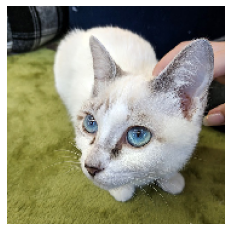

In [12]:
### 테스트 이미지 출력
import matplotlib.pyplot as plt

plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show() 

In [13]:
### 층 활성화를 반환하는 모델 생성
from tensorflow.keras import layers

## 모든 Conv2D와 MaxPooling2D 층의 출력을 하나의 리스트에 추가
layer_outputs = []
layer_names = []

for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
        
## 모델 입력이 주어졌을 때 층의 출력을 반환하는 모델
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs) 

위에 작성한 코드는 입력 이미지가 주입될 때 원본 모델의 활성화 값을 반환하는 모델이다<br>
이 모델은 하나의 입력과, 9개의 출력을 가진다 (층의 활성화마다 하나씩)

In [14]:
### 활성화 계산하기
activations = activation_model.predict(img_tensor)
activations

1/1 [==============================] - 0s 294ms/step


[array([[[[0.        , 0.        , 0.        , ..., 0.0068764 ,
           0.        , 0.01634355],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.0196452 ],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.02571486],
          ...,
          [0.        , 0.        , 0.00177027, ..., 0.00471755,
           0.00166714, 0.03106201],
          [0.        , 0.        , 0.00124692, ..., 0.003614  ,
           0.00044981, 0.03062664],
          [0.        , 0.        , 0.00326235, ..., 0.00558579,
           0.        , 0.02937583]],
 
         [[0.        , 0.        , 0.        , ..., 0.00869645,
           0.        , 0.01979826],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.02038523],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.00261548, 0.02175225],
          ...,
          [0.        , 0.        , 0.00250762, ..., 0.00962759,
   

In [15]:
## 첫번째 합성곱 층의 활성화 값
first_layer_activation = activations[0]
print(first_layer_activation.shape)    # 32개의 채널을 가진 178X178 크기의 feature map

(1, 178, 178, 32)


In [16]:
activations[1].shape

(1, 89, 89, 32)

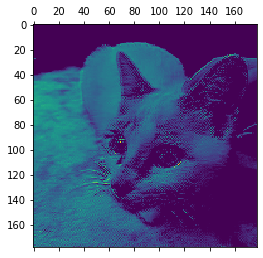

In [17]:
### 첫번째 층의 활성화 중 다섯번째 채널 시각화
#import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 5], cmap = 'viridis')
#plt.figure(figsize=(4,4))
plt.show()

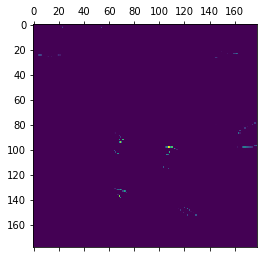

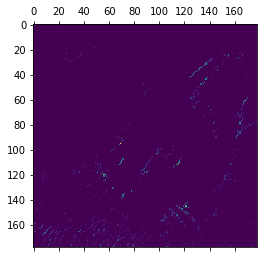

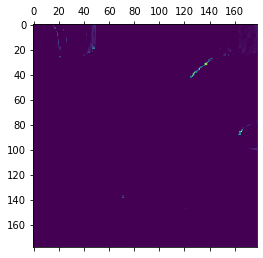

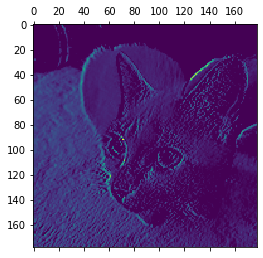

In [18]:
for i in range(4):
    plt.matshow(first_layer_activation[0, :, :, i], cmap = 'viridis')
    plt.show()

In [19]:
activations[2].shape

(1, 87, 87, 64)

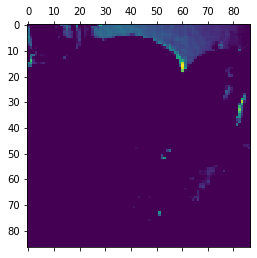

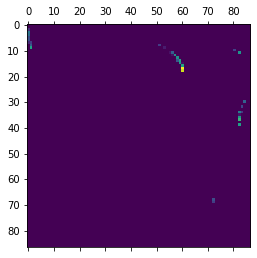

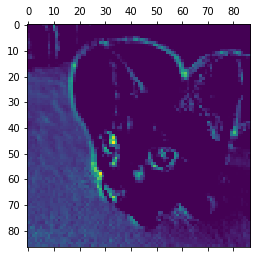

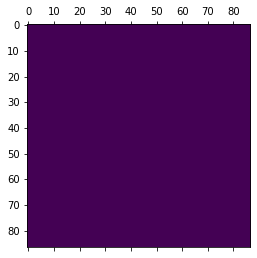

In [20]:
for i in range(4):
    plt.matshow(activations[2][0, :, :, i], cmap = 'viridis')
    plt.show()

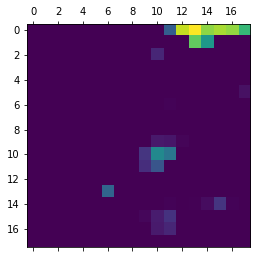

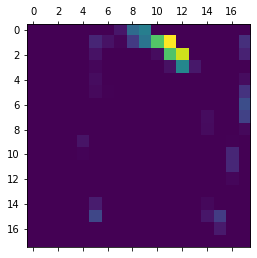

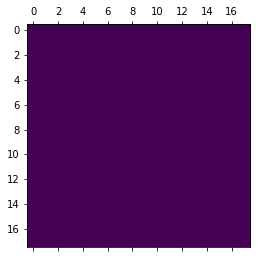

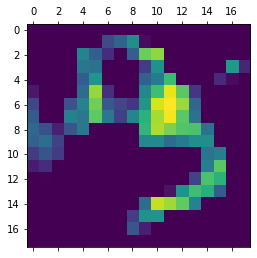

In [21]:
for i in range(4):
    plt.matshow(activations[6][0, :, :, i], cmap = 'viridis')
    plt.show()

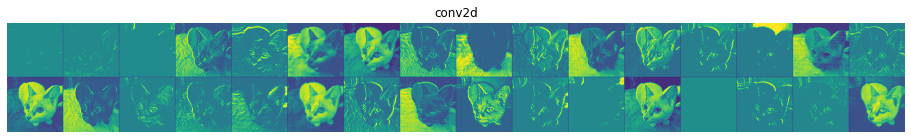

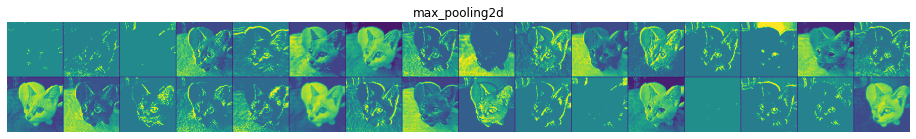

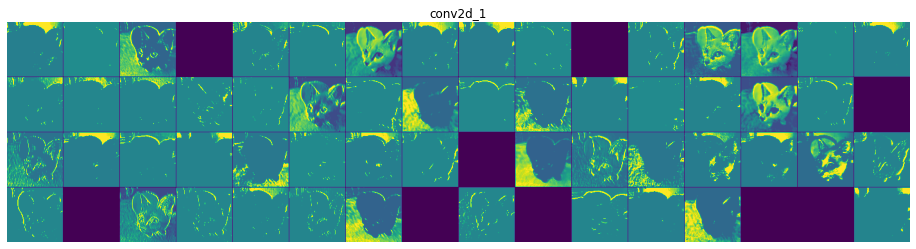

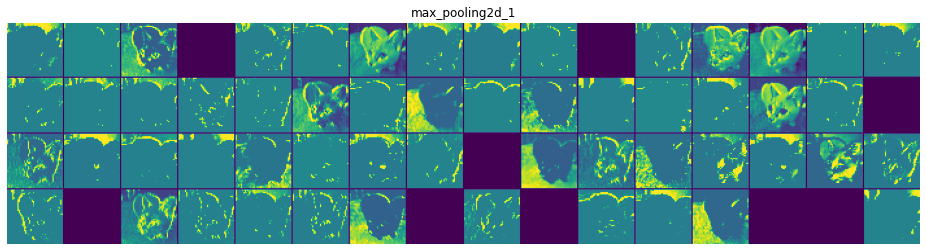

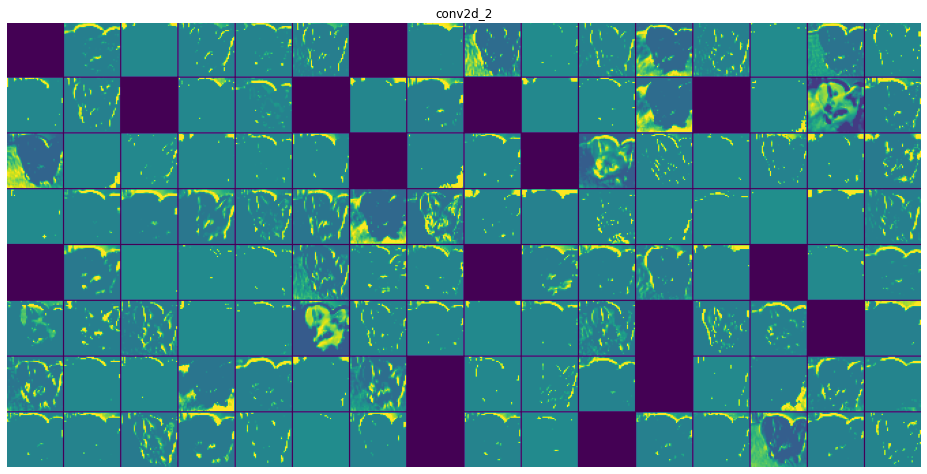

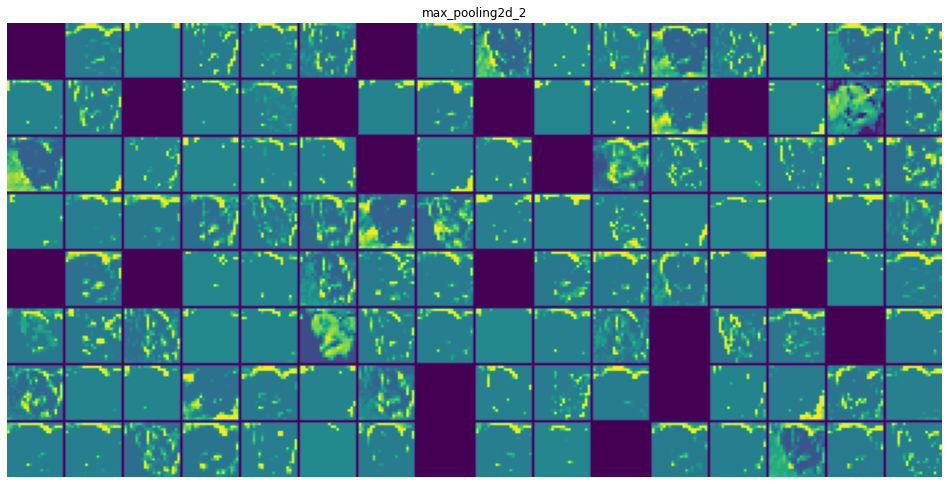

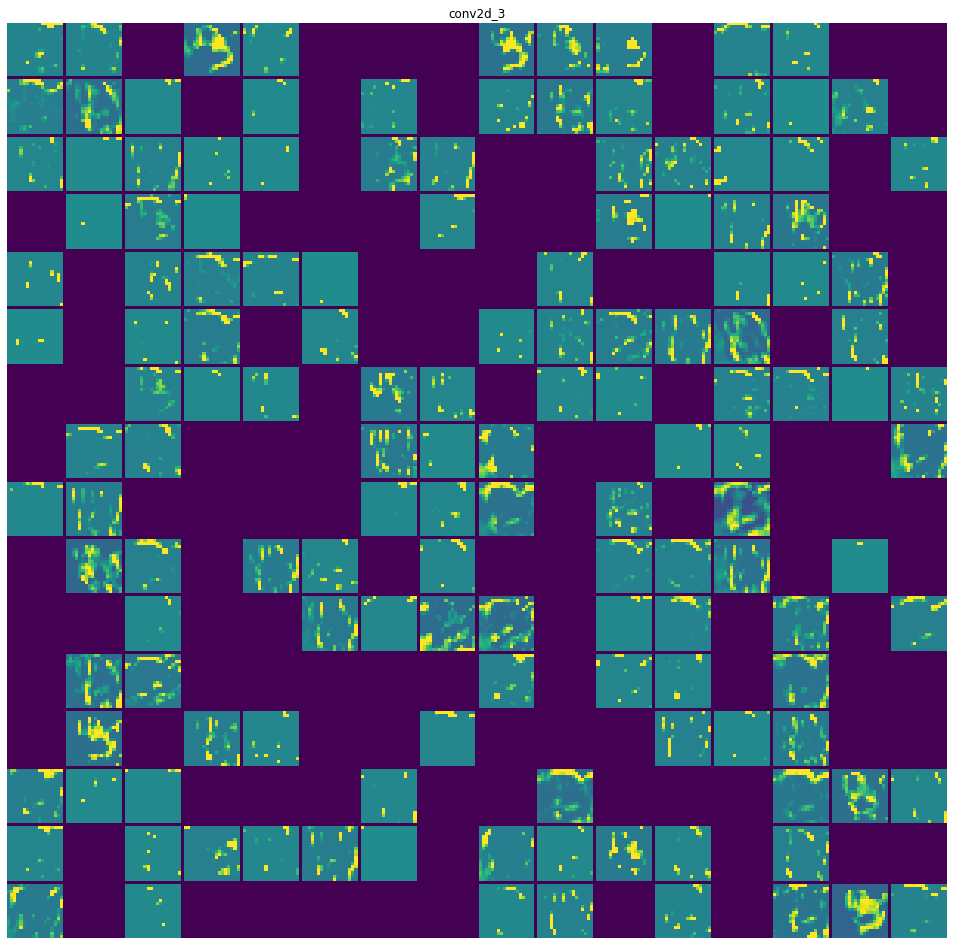

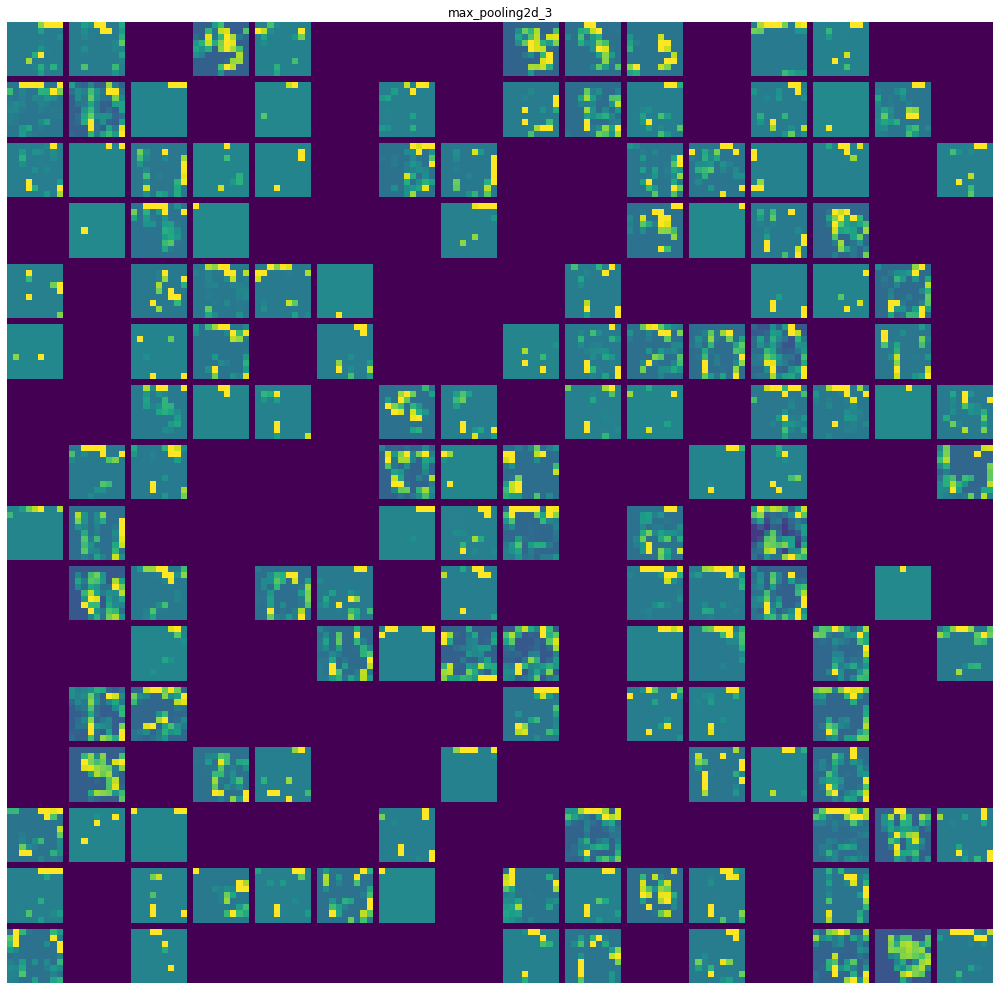

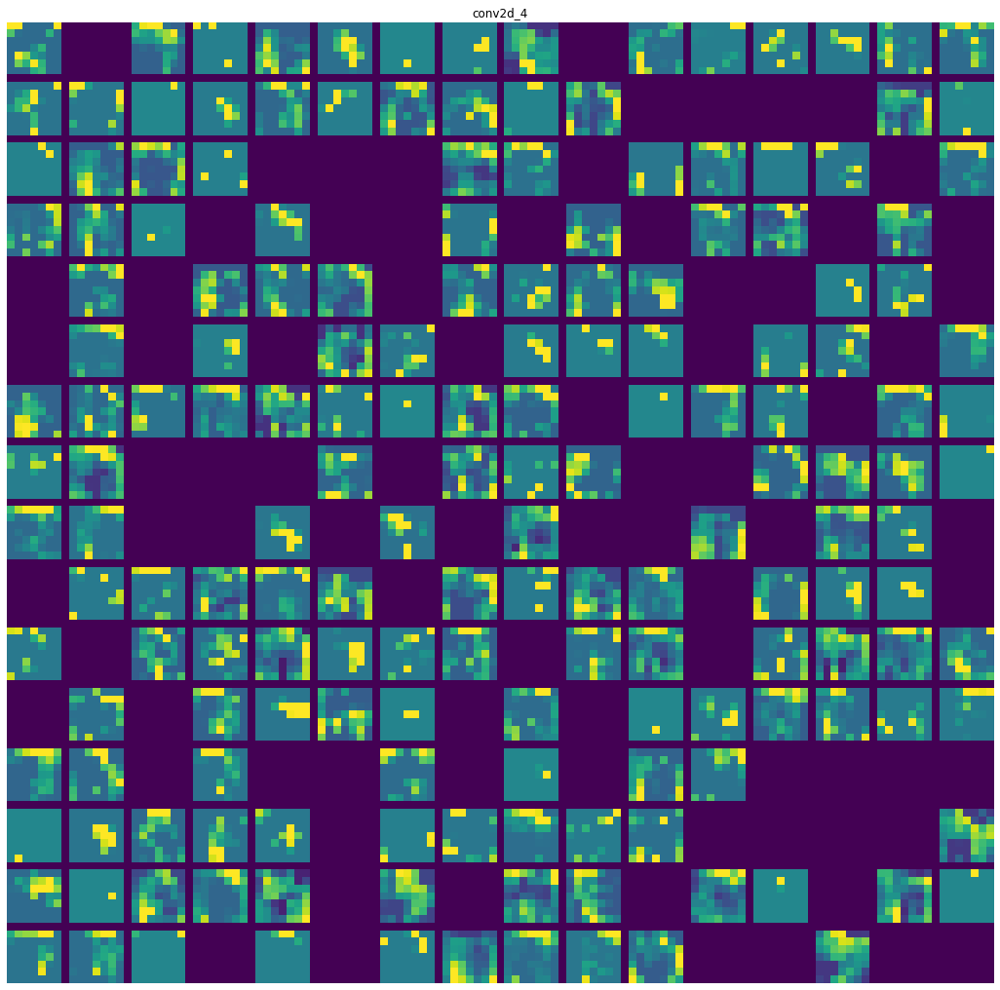

In [22]:
### 모든 층의 활성화에 있는 전체 채널 시각화
images_per_row = 16

## 활성화 & 해당 층 이름 에 대해 루프 순회
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]         # 층의 활성화 크기는 (1, size, size, n_features)
    n_cols = n_features // images_per_row
    
    # 활성화에 있BatchNormalization널을 출력하기 위한 빈 그리드
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            # 하나의 채널(또는 특성) 이미지
            channel_image = layer_activation[0, :, :, channel_index].copy()
            
            # 채널 값을 [0, 255] 범위로 정규화 (모두 0인 채널은 그대로)
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            
            # 빈 그리드에 채널 행렬 저장
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
            
    ## 그리드 출력
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis") 

- 첫번째 층은 여러 종류의 에지 감지기를 모아 놓은 것 같다<br>
이 단계의 활성화에는 초기 이미지에 있는 거의 모든 정보가 유지된다<br>

- 층이 깊어질수록 활성화는 점점 더 '추상적' 으로 되고 시각적으로 이해하기 어려워진다<br>
'고양이 귀' 와 '고양이 눈' 처럼 고수준 개념을 인코딩하기 시작한다<br>
깊은 층의 표현은 이미지의 시각적 콘텐츠에 관한 정보가 점점 줄어들고 이미지의 '클래스' 에 관한 정보가 점점 증가한다<br>

- 비어있는 활성화가 층이 깊어짐에 따라 늘어난다<br>
층을 올라가면서 활성화되지 않는 필터들이 생기는데, 이는 필터에 인코딩된 패턴이 입력 이미지에 나타나지 않았다는 것을 의미한다

### (2) 컨브넷 필터 시각화
컨브넷이 학습한 필터를 조사하는 또다른 방법은 각 필터가 반응하는 '시각적 패턴' 을 그려보는 것이다

In [23]:
### Xception 합성곱 기반 모델 생성
model = keras.applications.xception.Xception(
    weights='imagenet',
    include_top=False)    # 분류 층은 필요 없으므로 모델의 상단부를 제외

83683744/83683744 [==============================] - 1s 0us/step


In [24]:
### Xception에 있는 모든 합성곱 층의 이름 출력
for layer in model.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.SeparableConv2D)):
        print(layer.name)

block1_conv1
block1_conv2
block2_sepconv1
block2_sepconv2
conv2d_5
block3_sepconv1
block3_sepconv2
conv2d_6
block4_sepconv1
block4_sepconv2
conv2d_7
block5_sepconv1
block5_sepconv2
block5_sepconv3
block6_sepconv1
block6_sepconv2
block6_sepconv3
block7_sepconv1
block7_sepconv2
block7_sepconv3
block8_sepconv1
block8_sepconv2
block8_sepconv3
block9_sepconv1
block9_sepconv2
block9_sepconv3
block10_sepconv1
block10_sepconv2
block10_sepconv3
block11_sepconv1
block11_sepconv2
block11_sepconv3
block12_sepconv1
block12_sepconv2
block12_sepconv3
block13_sepconv1
block13_sepconv2
conv2d_8
block14_sepconv1
block14_sepconv2


In [25]:
### 특성 추출 모델 생성
layer_name = "block3_sepconv1"   # Xception 합성곱 기반에 있는 다른 층의 이름으로 변경
layer = model.get_layer(name=layer_name)   # 관심 대상인 층의 객체

# 입력 이미지가 주어졌을 때 해당 층의 출력을 반환하는 모델
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

In [26]:
### 특성 추출 모델 사용
activation = feature_extractor(
    keras.applications.xception.preprocess_input(img_tensor)
)

In [50]:
### 입력 이미지가 층의 필터를 얼마나 활성화하는지 확인
import tensorflow as tf

def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    
    # 활성화 테두리를 따라 두 픽셀 제외
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    
    return tf.reduce_mean(filter_activation)   # 필터에 대한 활성화 값의 평균 반환

#### * model.predict(x) 와 model(x) 의 차이
y = model.predict(x) 와 y = model(x) 둘 다 '입력 x 로 모델을 실행하여 얻은 출력 y' 를 의미하지만, 완전히 동일하지는 않다<br>

predict() 는 batch 로 데이터를 순회하면서 모델 출력을 넘파이 배열로 추출한다<br>
(predict(x, batch_size=64) 와 같이 배치 크기를 지정할 수 있다)<br>
이는 predict(x) 메서드가 매우 큰 배열을 처리할 수 있다는 의미이다<br>

반면 model(x) 는 모두 '메모리 내에서' 처리하며, 확장성이 없다<br>
또한 predict(x) 는 미분이 불가능하여 그레디언트를 구할 수 없지만, model(x) 는 구할 수 있다<br>

따라서 모델 호출의 그레디언트를 계산하려면 model(x) 를 사용하고,<br>
출력 값만 필요하다면 predict(x) 를 사용한다<br>
(저수준 경사하강법 루프를 작성하는 것이 아니라면, 거의 항상 predict() 메서드를 사용한다)

In [51]:
### 확률적 경사 상승법을 사용한 손실 최대화
# 경사 상승법 : 미분값을 더하면 함수값 증가

@tf.function    # 속도를 높이기 위해 데코레이터 사용

def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)    # 이미지 텐서는 텐서플로 변수가 아니므로 명시적으로 지정 (GradientTape는 텐서플로 변수만 자동으로 감시)
        loss = compute_loss(image, filter_index)   # 현재 이미지가 필터를 얼마나 활성화하는지 나타내는 스칼라 값
        
    grads = tape.gradient(loss, image)   # 이미지에 대한 손실의 그레디언트 계산
    grads = tf.math.l2_normalize(grads)  # '그레디언트 정규화' 적용
    image += learning_rate * grads       # 필터를 더 강하게 활성화시키는 방향으로 이미지 업데이트
    
    return image    # 업데이트된 이미지 반환

In [52]:
### 필터 시각화 생성 함수
img_width = 200
img_height = 200

def generate_filter_pattern(filter_index):
    iterations = 30        # 경사 상승법 단계를 적용할 반복횟수
    learning_rate = 10.    # 학습률
    image = tf.random.uniform(       # 랜덤한 값으로 이미지 텐서 초기화
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    
    # 손실함수를 최대화하도록 이미지 텐서 값을 반복적으로 업데이트
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
        
    return image[0].numpy()

In [53]:
### 출력 가능한 이미지로 변경하기 위한 후처리 (텐서를 이미지로 변환)
def deprocess_image(image):
    # [0, 255] 범위로 이미지 텐서 정규화
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]    # 부수 효과를 피하기 위해 경계 픽셀 제외
    
    return image

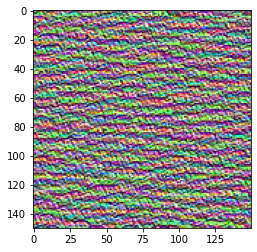

In [54]:
### block3_sepconv1 층에 있는 세번째 채널이 최대로 반응하는 패턴
#plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))
plt.show() 

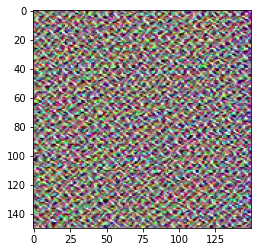

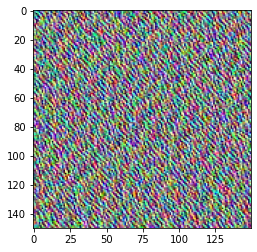

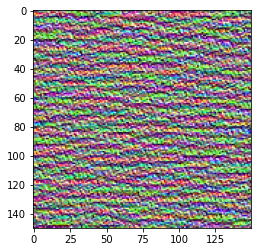

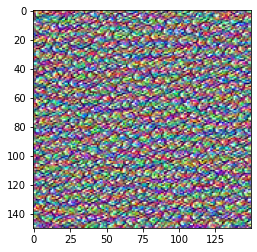

In [56]:
for i in range(4):
    plt.imshow(deprocess_image(generate_filter_pattern(filter_index=i)))
    plt.show()

Each layer learns a collection of filters,<br>
inputs can be expressed as a combination of the filters.

In [59]:
### 층에 있는 모든 필터의 응답 패턴에 대한 그리드 생성
all_images = []    # 층에 있는 처음 64개의 필터를 시각화하여 저장
for filter_index in range(64):
    #print(f"{filter_index}번 필터 처리중")
    image = deprocess_image(
        generate_filter_pattern(filter_index)
    )
    all_images.append(image)
    
## 필터 시각화를 출력할 빈 이미지 준비
margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n*cropped_width + (n-1)*margin
height = n*cropped_height + (n-1)*margin
stitched_filters = np.zeros((width, height, 3))

## 저장된 필터로 이미지를 채운다
for i in range(n):
    for j in range(n):
        image = all_images[i*n + j]
        stitched_filters[
            (cropped_width + margin)*i : (cropped_width + margin)*i + cropped_width,
            (cropped_height + margin)*j : (cropped_height + margin)*j + cropped_height,
            :,
        ] = image
        
## 이미지를 디스크에 저장
keras.utils.save_img(
    f"filters_for_layer_{layer_name}.png", stitched_filters)

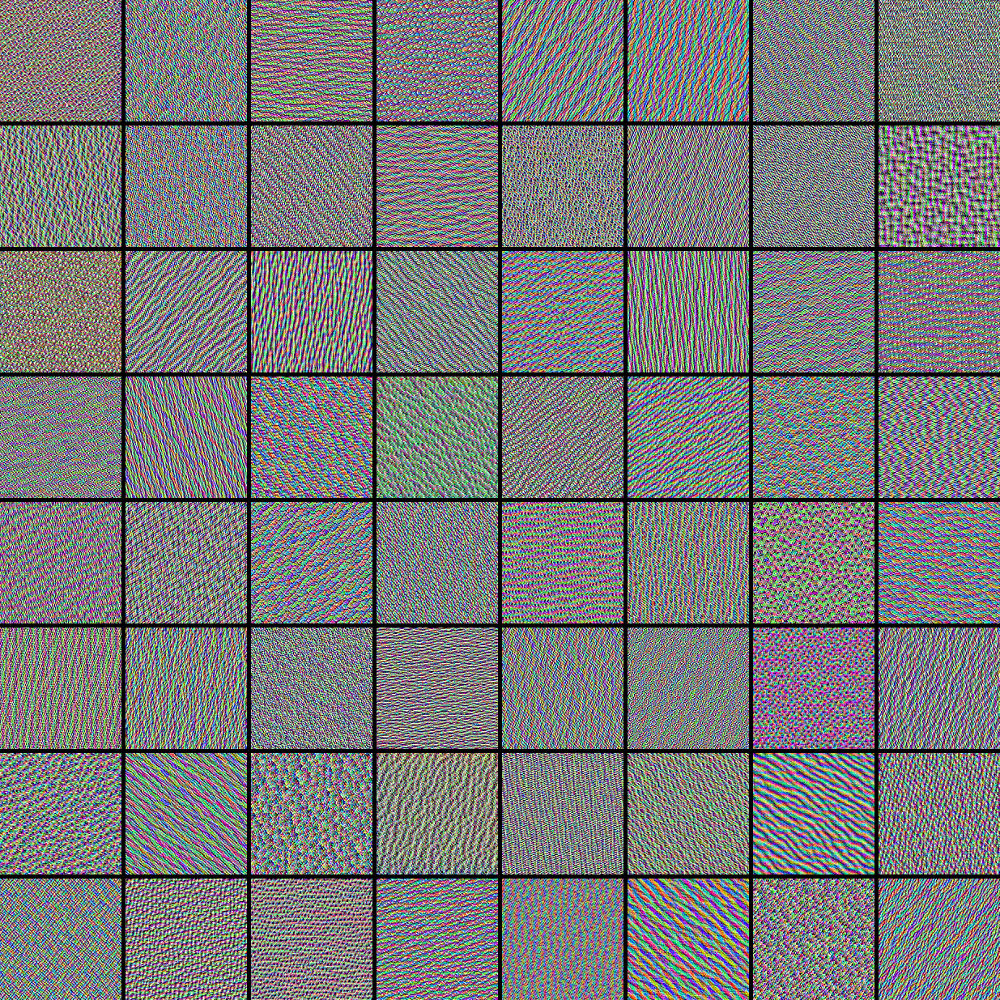

In [63]:
from IPython.display import Image
Image(f"filters_for_layer_{layer_name}.png")

컨브넷의 각 층은 필터의 조합으로 입력을 표현할 수 있는 일련의 필터를 학습하며,<br>
이 컨브넷 필터들은 모델의 층이 깊어질수록 점점 더 복잡해지고 개선된다<br>

- 모델에 있는 첫번째 층의 필터는 간단한 대각선 방향의 '에지와 색깔' 을 인코딩 한다<br>
- 조금 더 나중에 있는 층의 필터는 에지나 색깔의 조합으로 만들어진 간단한 '질감' 을 인코딩 한다<br>
- 더 뒤에 있는 층의 필터는 '깃털, 눈, 나뭇잎 등' 자연적인 질감을 닮아간다

### (3) 클래스 활성화의 히트맵 시각화
'클래스 활성화 맵 시각화 (CAM)'<br>
입력 이미지에 대한 클래스 활성화의 히트맵을 만드는 방법<br>
특정 출력 클래스에 대해 입력 이미지의 모든 위치를 계산한 2D 점수 그리드<br>
클래스에 대해 각 위치가 얼마나 중요한지를 알려준다

In [60]:
### 사전 훈련된 가중치로 Xception 네트워크 로드
model = keras.applications.xception.Xception(weights='imagenet')

### Xception 모델에 맞게 입력 이미지 전처리
img_path = keras.utils.get_file(
    fname='elephant.jpg',
    origin='https://img-datasets.s3.amazonaws.com/elephant.jpg')

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size)
    array = keras.utils.img_to_array(img)    # (299, 299, 3) 크기의 float32 넘파이 배열
    array = np.expand_dims(array, axis=0)    # 차원추가 : (1, 299, 299, 3) 크기의 배치로 변환
    array = keras.applications.xception.preprocess_input(array)    # 전처리 (채널별 컬러 정규화)
    
    return array

img_array = get_img_array(img_path, target_size=(299, 299))
img_array

733657/733657 [==============================] - 1s 1us/step


array([[[[ 0.54509807,  0.69411767,  0.827451  ],
         [ 0.5529412 ,  0.7019608 ,  0.8352941 ],
         [ 0.5529412 ,  0.7019608 ,  0.8352941 ],
         ...,
         [ 0.5058824 ,  0.62352943,  0.77254903],
         [ 0.5058824 ,  0.62352943,  0.77254903],
         [ 0.5058824 ,  0.62352943,  0.77254903]],

        [[ 0.5529412 ,  0.7019608 ,  0.8352941 ],
         [ 0.54509807,  0.69411767,  0.827451  ],
         [ 0.56078434,  0.70980394,  0.84313726],
         ...,
         [ 0.5058824 ,  0.62352943,  0.77254903],
         [ 0.5137255 ,  0.6313726 ,  0.78039217],
         [ 0.5137255 ,  0.6313726 ,  0.78039217]],

        [[ 0.5529412 ,  0.7019608 ,  0.8352941 ],
         [ 0.56078434,  0.70980394,  0.84313726],
         [ 0.56078434,  0.70980394,  0.84313726],
         ...,
         [ 0.5137255 ,  0.6392157 ,  0.7647059 ],
         [ 0.5058824 ,  0.6313726 ,  0.75686276],
         [ 0.5137255 ,  0.6392157 ,  0.7647059 ]],

        ...,

        [[-0.30196077, -0.25490195, -0

In [61]:
preds = model.predict(img_array)

# 예측 벡터를 이해하기 쉽게 디코딩
print(keras.applications.xception.decode_predictions(preds, top=3)[0])

35363/35363 [==============================] - 0s 0us/step
[('n02504458', 'African_elephant', 0.8699271), ('n01871265', 'tusker', 0.07696847), ('n02504013', 'Indian_elephant', 0.023537206)]


In [62]:
np.argmax(preds[0])

386

In [64]:
### 마지막 합성곱 출력을 반환하는 모델
last_conv_layer_name = "block14_sepconv2_act"

classifier_layer_names = [
    "avg_pool",
    "predictions",
]

last_conv_layer = model.get_layer(last_conv_layer_name)
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

In [ ]:
### 마지막 합성곱 출력 위에 있는 분류기에 적용하기 위한 모델
classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:])

x = classifier_input
for layer_name in classifier_layer_names:
    x = model.get_layer(layer_name)(x)
    
classifier_model = keras.Model(classifier_input, x)

In [ ]:
### 마지막 합성곱 층의 활성화에 대한 최상위 예측 클래스의 그레디언트
import tensorflow as tf

with tf.GradientTape() as tape:
    ## 마지막 합성곱 층의 활성화를 계산하고, 그레디언트 테이프로 감시
    last_conv_layer_output = last_conv_layer_model(img_array)
    tape.watch(last_conv_layer_output)
    
    ## 최상위 예측 클래스에 해당하는 활성화 채널 추출
    preds = classifier_model(last_conv_layer_output)
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, top_pred_index]

## 마지막 합성곱 층의 출력 특성 맵에 대한 최상위 예측 클래스의 그레디언트
grads = tape.gradient(top_class_channel, last_conv_layer_output)

In [ ]:
### 그레디언트를 평균하고 채널 중요도 가중치 적용

## 최상위 예측 클래스에 대한 각 채널의 중요도 정량화
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()

last_conv_layer_output = last_conv_layer_output.numpy()[0]

## 마지막 합성곱 층의 출력에 있는 각 채널에 '채널의 중요도'를 곱함
for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]
    
## 만들어진 특성 맵을 채널별로 평균 (클래스 활성화 히트맵 생성)
heatmap = np.mean(last_conv_layer_output, axis=-1)

In [ ]:
### 히트맵 후처리
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [ ]:
### 원본 이미지 위에 히트맵 그리기
import matplotlib.cm as cm

## 원본 이미지 로드
img = keras.utils.load_img(img_path)
img = keras.utils.img_to_array(img)

## 히트맵 범위 조정 (0~255 로)
heatmap = np.uint8(255 * heatmap)

## jet 컬러맵 사용 (히트맵의 색 변경)
jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]

## 새로운 히트맵을 담을 이미지 생성
jet_heatmap = keras.utils.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = keras.utils.img_to_array(jet_heatmap)

## 히트맵에 투명도 40% 지정, 원본 이미지를 합침
superimposed_img = jet_heatmap * 0.4 + img
superimposed_img = keras.utils.array_to_img(superimposed_img)

## 합친 이미지 저장
save_path = "elephant_cam.jpg"
superimposed_img.save(save_path)

## 이미지 로드
Image("elephant_cam.jpg")

## 10-1. 다양한 종류의 시계열 작업
시계열(timeseries) 데이터는 일정한 간격으로 측정하여 얻은 모든 데이터를 말한다<br>
주식의 일별 가격, 도시의 시간별 전력 소모량, 상점의 주간별 판매량 등<br>

시계열은 자연 현상 (지진, 물고기 개체 수의 변화, 한 지역의 날씨 등) 이나 인간의 활동 패턴 (웹 사이트 방문자, 신용 카드 거래 등)<br>
어디에서나 볼 수 있다<br>
시계열 데이터를 다루려면 '주기성, 시간에 따른 트렌드, 규칙적인 형태와 급격한 증가 등' 시스템의 역학을 이해해야한다<br>

가장 일반적인 시계열 관련 작업은 '예측(forecastig)' 이다<br>
현 시점의 시계열 데이터 다음에 일어날 것을 예측하는 것이다<br>
몇 시간 후의 전력 소모량, 며칠 후의 날씨 등 ..

## 10-2. 온도 예측 문제
건물 지붕 위의 센서에서 최근에 기록한 기압, 습도와 같은 매 시간 측정값의 시계열이 주어졌을 때<br>
24시간 뒤의 온도를 예측한다

In [65]:
### 예나 날씨 데이터셋 : 수년 간에 걸쳐 (온도, 기압, 습도, 풍향 등) 14개의 관측치가 10분마다 기록되어 있다
import os
fname = os.path.join('jena_climate_2009_2016.csv')   # join : 문자열 합침

with open(fname) as f:
    data = f.read()

lines = data.split("\n")
header = lines[0].split(",")   # 칼럼이름
lines = lines[1:]

print(header)
print(len(lines))

['"Date Time"', '"p (mbar)"', '"T (degC)"', '"Tpot (K)"', '"Tdew (degC)"', '"rh (%)"', '"VPmax (mbar)"', '"VPact (mbar)"', '"VPdef (mbar)"', '"sh (g/kg)"', '"H2OC (mmol/mol)"', '"rho (g/m**3)"', '"wv (m/s)"', '"max. wv (m/s)"', '"wd (deg)"']
420451


In [67]:
lines[:5]

['01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.30,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.30',
 '01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.40,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.10',
 '01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.90,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.60',
 '01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.20,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.00',
 '01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.10,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.30']

In [68]:
### 데이터 파싱 (42만 551개의 데이터 전체를 넘파이 배열로 변경)
# 온도(섭씨) 를 하나의 배열로 만들고, 나머지 데이터는 또 다른 배열로 만든다
temperature = np.zeros((len(lines), ))
raw_data = np.zeros((len(lines), len(header) - 1))

for i, line in enumerate(lines):
    values = [float(x) for x in line.split(",")[1:]]    # 'Date Time' 열은 제외
    temperature[i] = values[1]   # 두번째 열을 'temperature' 배열에 저장 (미래 온도를 예측하기 위해 사용)
    raw_data[i, :] = values[:]   # 모든 열을 'raw_data' 배열에 저장 (온도 포함)

In [69]:
raw_data[:3]

array([[ 9.96520e+02, -8.02000e+00,  2.65400e+02, -8.90000e+00,
         9.33000e+01,  3.33000e+00,  3.11000e+00,  2.20000e-01,
         1.94000e+00,  3.12000e+00,  1.30775e+03,  1.03000e+00,
         1.75000e+00,  1.52300e+02],
       [ 9.96570e+02, -8.41000e+00,  2.65010e+02, -9.28000e+00,
         9.34000e+01,  3.23000e+00,  3.02000e+00,  2.10000e-01,
         1.89000e+00,  3.03000e+00,  1.30980e+03,  7.20000e-01,
         1.50000e+00,  1.36100e+02],
       [ 9.96530e+02, -8.51000e+00,  2.64910e+02, -9.31000e+00,
         9.39000e+01,  3.21000e+00,  3.01000e+00,  2.00000e-01,
         1.88000e+00,  3.02000e+00,  1.31024e+03,  1.90000e-01,
         6.30000e-01,  1.71600e+02]])

In [70]:
temperature[:3]

array([-8.02, -8.41, -8.51])

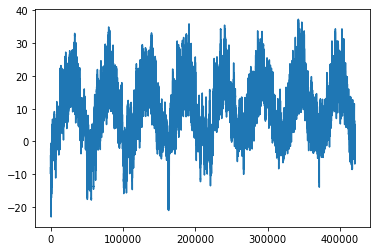

In [71]:
### 전체 온도를 그래프로 그리기
plt.plot(range(len(temperature)), temperature)
plt.show()

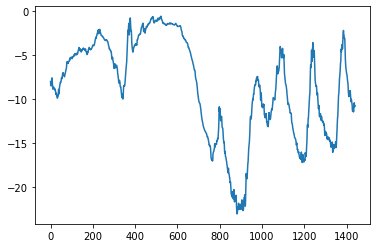

In [72]:
### 처음 10일간의 온도를 그래프로 (10분마다 데이터 기록, 하루에 총 144개의 데이터 포인트)
plt.plot(range(144 * 10), temperature[:1440])
plt.show()

위의 그래프에서 '일별 주기성' 을 볼 수 있다

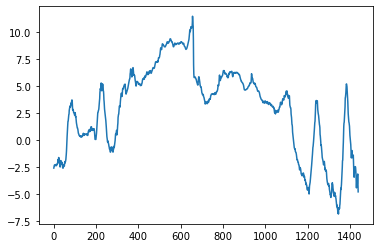

In [73]:
### 최근 10일간의 온도
plt.plot(range(144 * 10), temperature[-1440:])
plt.show()

In [74]:
### 각 분할에 사용할 샘플 개수 계산
# 시계열 데이터를 다룰 때는 검증 데이터와 테스트 데이터가 훈련 데이터보다 최신 이어야 한다
# 과거를 바탕으로 미래를 예측하기 때문

num_train_samples = int(0.5 * len(raw_data))
num_val_samples = int(0.25 * len(raw_data))
num_test_samples = len(raw_data) - num_train_samples - num_val_samples

print("num_train_samples:", num_train_samples)
print("num_val_samples:", num_val_samples)
print("num_test_samples:", num_test_samples)

num_train_samples: 210225
num_val_samples: 105112
num_test_samples: 105114


### (1) 데이터 준비
한 시간에 한 번씩 샘플링 된 5일간의 데이터가 주어졌을 때 24시간 뒤의 온도를 예측할 수 있을 것인가?

In [75]:
### 데이터 정규화 (num_train_samples = 210,225)
mean = raw_data[:num_train_samples].mean(axis=0)
raw_data -= mean
std = raw_data[:num_train_samples].std(axis=0)
raw_data /= std

#### * timeseries_dataset_from_array()
시계열 데이터를 제너레이터로 가져오는 함수<br>
이 함수에 targets 매개변수로 타깃 배열을 전달할 수 있다<br>
targets 배열의 첫번째 원소는 data 배열에서 생성될 첫번째 시퀀스에 대한 타깃이어야 한다<br>
따라서 시계열 예측을 수행한다면 targets 는 약간의 시간차를 두고 data 배열과 동일해야 한다

In [82]:
print(np.arange(10))
print(np.arange(10)[:-3])
print(np.arange(10)[3:])

[0 1 2 3 4 5 6 7 8 9]
[0 1 2 3 4 5 6]
[3 4 5 6 7 8 9]


In [76]:
import numpy as np
from tensorflow import keras

int_sequence = np.arange(10)   # 0에서 9까지의 정렬된 정수 배열

dummy_dataset = keras.utils.timeseries_dataset_from_array(
    data=int_sequence[:-3],    # 생성할 시퀀스는 [0 1 2 3 4 5 6] 에서 샘플링 됨
    targets=int_sequence[3:],  # data[N] 에서 시작하는 시퀀스의 타깃은 data[N+3]
    sequence_length=3,         # 시퀀스의 길이 = 3
    batch_size=2,              # 시퀀스의 배치 크기 = 2
)

for inputs, targets in dummy_dataset:
    for i in range(inputs.shape[0]):
        print([int(x) for x in inputs[i]], int(targets[i])) 

[0, 1, 2] 3
[1, 2, 3] 4
[2, 3, 4] 5
[3, 4, 5] 6
[4, 5, 6] 7


In [77]:
int_sequence = np.arange(10)

dummy_dataset = keras.utils.timeseries_dataset_from_array(
    data=int_sequence[:-3],
    targets=int_sequence[5:],
    sequence_length=3,
    batch_size=2,
)

for inputs, targets in dummy_dataset:
    for i in range(inputs.shape[0]):
        print([int(x) for x in inputs[i]], int(targets[i]))

[0, 1, 2] 5
[1, 2, 3] 6
[2, 3, 4] 7
[3, 4, 5] 8
[4, 5, 6] 9


In [78]:
### 훈련, 검증, 테스트 데이터셋 만들기
sampling_rate = 6        # 시간당 하나의 데이터 포인트가 샘플링 됨 (즉 6개의 데이터 포인트 중 하나만 사용)
sequence_length = 120    # 이전 5일간(120시간)의 데이터 사용
delay = sampling_rate * (sequence_length + 24 - 1)    # 시퀀스의 타깃은 시퀀스 끝에서 24시간 후의 온도
batch_size = 256

train_dataset = keras.utils.timeseries_dataset_from_array(
    raw_data[:-delay],
    targets=temperature[delay:],
    sampling_rate=sampling_rate,
    sequence_length=sequence_length,
    shuffle=True,
    batch_size=batch_size,
    start_index=0,
    end_index=num_train_samples)

val_dataset = keras.utils.timeseries_dataset_from_array(
    raw_data[:-delay],
    targets=temperature[delay:],
    sampling_rate=sampling_rate,
    sequence_length=sequence_length,
    shuffle=True,
    batch_size=batch_size,
    start_index=num_train_samples,
    end_index=num_train_samples + num_val_samples)

test_dataset = keras.utils.timeseries_dataset_from_array(
    raw_data[:-delay],
    targets=temperature[delay:],
    sampling_rate=sampling_rate,
    sequence_length=sequence_length,
    shuffle=True,
    batch_size=batch_size,
    start_index=num_train_samples + num_val_samples) 

In [79]:
### 훈련 데이터셋의 배치 크기 확인
for samples, targets in train_dataset:
    print("샘플 크기:", samples.shape)
    print("타깃 크기:", targets.shape)
    break 

샘플 크기: (256, 120, 14)
타깃 크기: (256,)


### (2) 상식 수준의 기준점
상식 수준의 해법은 알려진 해결책이 없는 새로운 문제를 다루어야할 때 유용하다<br>
(일부 클래스가 월등히 많아 불균형한 분류 작업의 경우)<br>

이 경우 상식 수준의 해결책은 지금으로부터 24 시간 후 온도가 지금과 동일하다고 예측하는 것이다

In [46]:
### 상식 수준 모델의 MAE
def evaluate_naive_method(dataset):
    total_abs_err = 0.
    samples_seen = 0
    for samples, targets in dataset:
        preds = samples[:, -1, 1] * std[1] + mean[1]
        total_abs_err += np.sum(np.abs(preds - targets))
        samples_seen += samples.shape[0]
        
    return total_abs_err / samples_seen

print(f"검증 MAE: {evaluate_naive_method(val_dataset):.2f}")
print(f"테스트 MAE: {evaluate_naive_method(test_dataset):.2f}")

검증 MAE: 2.44
테스트 MAE: 2.62


* preds = samples[:, -1, 1] * std[1] + mean[1]<br>
온도 특성은 칼럼 인덱스 1 에 있다<br>
따라서 samples[:, -1, 1] 이 입력 시퀀스에 있는 마지막 온도 측정값이다<br>
특성을 정규화했기 때문에 온도를 섭씨로 바꾸려면 표준편차를 곱하고 평균을 더해야한다

### (3) 기본적인 머신 러닝 모델 (DNN)

In [47]:
### Dense layer (밀집 연결 모델) 훈련 및 평가
from tensorflow import keras
from tensorflow.keras import layers

inputs = keras.Input(shape=(sequence_length, raw_data.shape[-1]))
x = layers.Flatten()(inputs)
x = layers.Dense(16, activation="relu")(x)
outputs = layers.Dense(1)(x)
model = keras.Model(inputs, outputs)

## 콜백 사용 : 최상의 모델 저장
callbacks = [
    keras.callbacks.ModelCheckpoint("jena_dense.keras",
                                    save_best_only=True)
]

model.compile(optimizer="rmsprop", loss="mse", metrics=["mae"])
history = model.fit(train_dataset,
                    epochs=10,
                    validation_data=val_dataset,
                    callbacks=callbacks)

## 최상의 모델 다시 로드, 테스트 데이터에서 평가
model = keras.models.load_model("jena_dense.keras")

print(f"테스트 MAE: {model.evaluate(test_dataset)[1]:.2f}") 

Epoch 1/10
819/819 [==============================] - 21s 25ms/step - loss: 16.1033 - mae: 3.0976 - val_loss: 10.9932 - val_mae: 2.6234
Epoch 2/10
819/819 [==============================] - 18s 22ms/step - loss: 10.3433 - mae: 2.5277 - val_loss: 11.5264 - val_mae: 2.6910
Epoch 3/10
819/819 [==============================] - 20s 24ms/step - loss: 9.2723 - mae: 2.3957 - val_loss: 10.1270 - val_mae: 2.5175
Epoch 4/10
819/819 [==============================] - 21s 25ms/step - loss: 8.5819 - mae: 2.3043 - val_loss: 10.3035 - val_mae: 2.5364
Epoch 5/10
819/819 [==============================] - 21s 26ms/step - loss: 8.0538 - mae: 2.2342 - val_loss: 11.0203 - val_mae: 2.6240
Epoch 6/10
819/819 [==============================] - 20s 24ms/step - loss: 7.6579 - mae: 2.1799 - val_loss: 10.7153 - val_mae: 2.5801
Epoch 7/10
819/819 [==============================] - 21s 26ms/step - loss: 7.3399 - mae: 2.1349 - val_loss: 11.2126 - val_mae: 2.6437
Epoch 8/10
819/819 [==============================] -

### (4) 1D 합성곱 (Conv1D) 모델 (CNN)

In [48]:
### 1D 합성곱 (Conv1D) 모델
inputs = keras.Input(shape=(sequence_length, raw_data.shape[-1]))

## Conv 과정 (CNN)
x = layers.Conv1D(8, 24, activation="relu")(inputs)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(8, 12, activation="relu")(x)
x = layers.MaxPooling1D(2)(x)
x = layers.Conv1D(8, 6, activation="relu")(x)
x = layers.GlobalAveragePooling1D()(x)   # 하나로 합침

## Dense 과정 (DNN)
outputs = layers.Dense(1)(x)
model = keras.Model(inputs, outputs)

callbacks = [
    keras.callbacks.ModelCheckpoint("jena_conv.keras",
                                    save_best_only=True)
]

model.compile(optimizer="rmsprop", loss="mse", metrics=["mae"])

history = model.fit(train_dataset,
                    epochs=10,
                    validation_data=val_dataset,
                    callbacks=callbacks)

model = keras.models.load_model("jena_conv.keras")
print(f"테스트 MAE: {model.evaluate(test_dataset)[1]:.2f}") 

Epoch 1/10
819/819 [==============================] - 37s 42ms/step - loss: 21.7058 - mae: 3.6256 - val_loss: 15.1022 - val_mae: 3.0647
Epoch 2/10
819/819 [==============================] - 35s 42ms/step - loss: 15.2351 - mae: 3.0908 - val_loss: 15.1312 - val_mae: 3.0523
Epoch 3/10
819/819 [==============================] - 34s 42ms/step - loss: 14.0730 - mae: 2.9654 - val_loss: 17.1429 - val_mae: 3.2751
Epoch 4/10
819/819 [==============================] - 35s 42ms/step - loss: 13.3217 - mae: 2.8856 - val_loss: 14.1902 - val_mae: 2.9671
Epoch 5/10
819/819 [==============================] - 34s 41ms/step - loss: 12.7678 - mae: 2.8234 - val_loss: 14.2295 - val_mae: 2.9689
Epoch 6/10
819/819 [==============================] - 35s 42ms/step - loss: 12.3203 - mae: 2.7754 - val_loss: 14.6607 - val_mae: 2.9935
Epoch 7/10
819/819 [==============================] - 35s 43ms/step - loss: 11.9035 - mae: 2.7298 - val_loss: 13.5933 - val_mae: 2.8886
Epoch 8/10
819/819 [============================

<br>
Conv1D 모델은 DNN 모델보다 성능이 좋지 않다<br>

* 날씨 데이터는 '평행 이동 불변성 가정' 을 많이 따르지 않는다<br>
데이터에 일별 주기성이 있지만 아침 데이터는 저녁이나 한밤중의 데이터와 성질이 다르다<br>
날씨 데이터는 매우 특정한 시간 범위에 대해서만 '평행 이동 불변성' 을 갖는다<br>

* 날씨 데이터는 '순서' 가 매우 중요하다<br>
최근 데이터가 5일 전 데이터보다 내일 온도를 예측하는데 훨씬 더 유용하다<br>
Conv1D 은 이런 사실을 활용할 수 없다<br>
MaxPooling (최대 풀링) 과 GlobalAveragePooling (전역 평균 풀링) 층 때문에 순서 정보가 많이 삭제된다

밀집 연결 모델 (Dense, DNN) 은 시계열 데이터를 펼쳤기 때문에 입력 데이터에서 시간 개념을 잃어버렸다<br>
합성곱 모델 (Conv1D, CNN) 은 데이터의 모든 부분을 비슷한 방식으로 처리했으며 Pooling 을 적용하여 순서 정보를 잃어버렸다

### (5) 첫번째 순환 신경망
LSTM : 순환신경망의 일종

In [49]:
### 간단한 LSTM 기반 모델
inputs = keras.Input(shape=(sequence_length, raw_data.shape[-1]))
x = layers.LSTM(units=16)(inputs)
outputs = layers.Dense(units=1)(x)
model = keras.Model(inputs, outputs)

callbacks = [
    keras.callbacks.ModelCheckpoint("jena_lstm.keras",
                                    save_best_only=True)
]

model.compile(optimizer="rmsprop", loss="mse", metrics=["mae"])

history = model.fit(train_dataset,
                    epochs=10,
                    validation_data=val_dataset,
                    callbacks=callbacks)

model = keras.models.load_model("jena_lstm.keras")
print(f"테스트 MAE: {model.evaluate(test_dataset)[1]:.2f}") 

Epoch 1/10
819/819 [==============================] - 48s 55ms/step - loss: 42.1080 - mae: 4.7186 - val_loss: 12.5668 - val_mae: 2.7003
Epoch 2/10
819/819 [==============================] - 45s 55ms/step - loss: 11.0113 - mae: 2.5855 - val_loss: 9.9300 - val_mae: 2.4421
Epoch 3/10
819/819 [==============================] - 45s 55ms/step - loss: 9.8875 - mae: 2.4616 - val_loss: 10.5840 - val_mae: 2.4980
Epoch 4/10
819/819 [==============================] - 45s 55ms/step - loss: 9.3851 - mae: 2.3963 - val_loss: 9.9725 - val_mae: 2.4340
Epoch 5/10
819/819 [==============================] - 45s 55ms/step - loss: 9.0539 - mae: 2.3487 - val_loss: 10.0728 - val_mae: 2.4348
Epoch 6/10
819/819 [==============================] - 45s 54ms/step - loss: 8.7061 - mae: 2.2990 - val_loss: 10.7749 - val_mae: 2.4888
Epoch 7/10
819/819 [==============================] - 45s 55ms/step - loss: 8.3300 - mae: 2.2537 - val_loss: 10.5481 - val_mae: 2.4665
Epoch 8/10
819/819 [==============================] - 4

# 221207 Day72

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [6]:
import keras
from keras import Sequential
from keras import layers
from keras import optimizers
from keras.layers import Input, Dense

In [7]:
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Input, Rescaling, Conv2D, MaxPooling2D, Dense, Flatten

## 10-3. 순환 신경망 (RNN, Recurrent Neural Network)
DNN 이나 CNN 의 layer 에 주입되는 입력은 개별적으로 처리되며 입력 간에 유지되는 '상태' 가 없다<br>
이러한 네트워크로 시퀀스나 시계열 데이터 포인트를 처리하려면 layer 에 전체 시퀀스를 주입해야 한다<br>
즉 전체 시퀀스를 하나의 데이터 포인트로 변환해야하는 것이다<br>

하지만 이와 달리 '순환 신경망 (RNN)' 은 시퀀스의 원소를 순회하면서 지금까지 처리한 정보를 '저장' 하는 것이다<br>
RNN 은 내부에 루프(loop) 를 가진 신경망의 한 종류로, layer 를 통과한 입력값(=즉 출력값)을 저장해두었다가<br>
이 값을 다시 입력값으로 layer 에 주입할 수 있다

In [ ]:
### 의사 코드 (pseudocode) 로 표현한 RNN
state_t = 0    # 초기값
for input_t in input_sequence:       # 시퀀스의 원소 반복
    output_t = f(input_t, state_t)   # f 함수는 입력과 상태를 출력으로 변환한다
    state_t = output_t    # 출력은 다음 반복을 위한 상태값이 된다 (출력값을 저장함)
    
    
### 좀 더 자세한 의사 코드로 표현한 RNN
state_t = 0
for input_t in input_sequence:                   # state_t : 이전 단계의 output
    output_t = activation(dot(W, input_t) + dot(U, state_t) + b)
    state_t = output_t

In [ ]:
### 넘파이로 구현한 간단한 RNN (=SimpleRNN 층)
timesteps = 100        # 입력 시퀀스에 있는 타임스텝의 수
input_features = 32    # 입력 특성의 차원
output_features = 64   # 출력 특성의 차원

inputs = np.random.random((timesteps, input_features))   # 입력 데이터 : 예제를 위한 랜덤한 잡음
state_t = np.zeros((output_features, ))   # 초기 상태 : 0 벡터

# 랜덤한 가중치(W, U, b) 행렬 생성
W = np.random.random((output_features, input_features))
U = np.random.random((output_features, output_features))
b = np.random.random((output_features, ))

successive_outputs = []
for input_t in inputs:    #input_t : (input_features, ) 크기의 벡터
    output_t = np.tanh(np.dot(W, input_t) + np.dot(U, state_t) + b)   # 입력과 이전 출력값 을 연결하여 현재 출력값을 얻는다
    successive_outputs.append(output_t)    # 출력값을 리스트에 저장
    state_t = output_t    # 다음 상태값을 위해 업데이트
    
final_output_sequence = np.stack(successive_outputs, axis=0)   # 최종 출력은 (timesteps, output_features) 크기

즉 RNN 은 반복할 때 이전에 계산한 정보를 재사용 하는 for 문 과 비슷하다

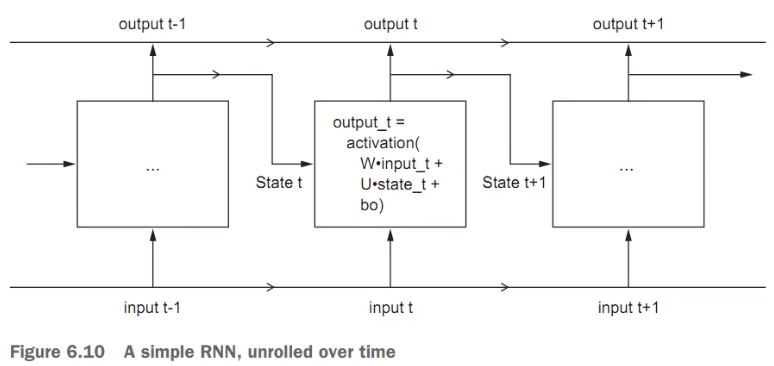

### (1) 케라스의 순환층
위에서 넘파이로 간단하게 구현한 과정이 실제 케라스의 'SimpleRNN' 층에 해당한다<br>
넘파이 예제와 한가지 다른 점은 'SimpleRNN' 은 하나의 시퀀스가 아니라 '시퀀스의 배치' 를 처리한다는 것이다<br>
따라서 입력으로 (batch_size, timesteps, input_features) 크기의 데이터를 받는다

In [ ]:
### 어떤 길이의 시퀀스도 처리할 수 있는 RNN 층
num_features = 14
inputs = keras.Input(shape=(None, num_features))   # None : 임의의 길이를 가진 시퀀스를 처리할 수 있다
outputs = laters.SimpleRNN(units=16)(inputs)

케라스의 모든 순환 층 (SimpleRNN, LSTM, GRU) 은 두 가지 모드로 실행할 수 있다<br>
모든 출력값을 모은 전체 시퀀스 ((batch_size, timesteps, output_features) 크기의 3차원 텐서) 를 반환하거나<br>
입력 시퀀스의 마지막 출력 ((batch_size, output_features) 크기의 2차원 텐서) 만 반환할 수 있다<br>

이 두가지 모드는 return_sequences 매개변수로 제어할 수 있다

In [ ]:
### 마지막 출력 스텝만 반환하는 RNN 층 (return_sequences=False)
num_features=14
steps=120
inputs = keras.Input(shape=(steps, num_features))
outputs = layers.SimpleRNN(units=16, return_sequences=False)(inputs)

print(outputs.shape)

In [ ]:
### 전체 출력 시퀀스를 반환하는 RNN 층 (return_sequences=True)
num_features=14
steps=120
inputs = keras.Input(shape=(steps, num_features))
outputs = layers.SimpleRNN(units=16, return_sequences=True)(inputs)

print(outputs.shape)

layer 의 표현력을 증가시키기 위해 여러 개의 순환층을 차례대로 쌓는 것(stacking)이 유용할 때가 있다<br>
이러한 경우 중간층들이 전체 출력 시퀀스를 반환하도록(True) 설정해야 한다

In [ ]:
### 스태킹(Stacking) RNN 층
num_features=14
steps=120

inputs = keras.Input(shape=(steps, num_features))
x = layers.SimpleRNN(units=16, return_sequences=True)(inputs)
x = layers.SimpleRNN(units=16, return_sequences=True)(x)
outputs = layers.SimpleRNN(units=16)(x)

SimpleRNN 층은 이론적으로 시간 t 에서 이전의 모든 타임스텝의 정보를 유지할 수 있지만,<br>
실제로 긴 시간에 걸친 의존성은 학습할 수 없으며 이는 '그레디언트 소실' 문제 때문이다<br>
이러한 문제를 해결하기 위해 'LSTM' 과 'GRU' 층이 있다

#### * LSTM

In [ ]:
### LSTM 구조의 의사 코드
# c_t : 이동 상태 (타임 스텝을 가로질러 정보를 나르는 데이터 흐름)
output_t = activation(c_t) * activation(dot(input_t, Wo) + dot(state_t, Uo) + bo)
i_t = activation(dot(state_t, Ui) + dot(input_t, Wi) + bi)
f_t = activation(dot(state_t, Uf) + dot(input_t, Wf) + bf)
k_t = activation(dot(state_t, Uk) + dot(input_t, Wk) + bk)

## 새로운 이동 상태
c_t+1 = (i_t * k_t) + (c_t * f_t)

위의 연산이 하는 일은 연산에 관련된 '가중치 행렬' 에 따라 결정된다<br>
이 가중치는 '엔드-투-엔드 (데이터를 넣으면 결과값이 나올때까지 개입하지 않는다)' 방식으로 학습된다<br>
같은 셀(cell, layer) 이라 하더라도 다른 가중치를 가지는 경우, 매우 다른 작업을 수행한다<br>
즉 핵심은, LSTM 층의 역할은 과거 정보를 나중에 다시 주입하여 그레디언트 소실 문제를 해결하는 것이다

## 10-4. 순환 신경망의 고급 사용법

#### * RNN 의 고급 기능 (MAE 를 높이기 위한 방법)
① 순환 드롭아웃 (recurrent dropout) : 드롭아웃의 한 종류로, 순환 층에서 과대적합을 방지하기 위해 사용<br>
② 스태킹 순환 층 : 모델의 표현 능력 (representational power) 을 증가시킴<br>
③ 양방향 순환 층 : 순환 네트워크에 같은 정보를 다른 방향으로 주입하여 정확도를 높이고 기억을 좀 더 오래 유지

* DataFrame 을 array 로

In [8]:
import pydataset
mpg = pydataset.data('mpg')

In [9]:
mpg['model'].values

array(['a4', 'a4', 'a4', 'a4', 'a4', 'a4', 'a4', 'a4 quattro',
       'a4 quattro', 'a4 quattro', 'a4 quattro', 'a4 quattro',
       'a4 quattro', 'a4 quattro', 'a4 quattro', 'a6 quattro',
       'a6 quattro', 'a6 quattro', 'c1500 suburban 2wd',
       'c1500 suburban 2wd', 'c1500 suburban 2wd', 'c1500 suburban 2wd',
       'c1500 suburban 2wd', 'corvette', 'corvette', 'corvette',
       'corvette', 'corvette', 'k1500 tahoe 4wd', 'k1500 tahoe 4wd',
       'k1500 tahoe 4wd', 'k1500 tahoe 4wd', 'malibu', 'malibu', 'malibu',
       'malibu', 'malibu', 'caravan 2wd', 'caravan 2wd', 'caravan 2wd',
       'caravan 2wd', 'caravan 2wd', 'caravan 2wd', 'caravan 2wd',
       'caravan 2wd', 'caravan 2wd', 'caravan 2wd', 'caravan 2wd',
       'dakota pickup 4wd', 'dakota pickup 4wd', 'dakota pickup 4wd',
       'dakota pickup 4wd', 'dakota pickup 4wd', 'dakota pickup 4wd',
       'dakota pickup 4wd', 'dakota pickup 4wd', 'dakota pickup 4wd',
       'durango 4wd', 'durango 4wd', 'durango 4wd', 'dur

In [10]:
mpg['model'].to_numpy()

array(['a4', 'a4', 'a4', 'a4', 'a4', 'a4', 'a4', 'a4 quattro',
       'a4 quattro', 'a4 quattro', 'a4 quattro', 'a4 quattro',
       'a4 quattro', 'a4 quattro', 'a4 quattro', 'a6 quattro',
       'a6 quattro', 'a6 quattro', 'c1500 suburban 2wd',
       'c1500 suburban 2wd', 'c1500 suburban 2wd', 'c1500 suburban 2wd',
       'c1500 suburban 2wd', 'corvette', 'corvette', 'corvette',
       'corvette', 'corvette', 'k1500 tahoe 4wd', 'k1500 tahoe 4wd',
       'k1500 tahoe 4wd', 'k1500 tahoe 4wd', 'malibu', 'malibu', 'malibu',
       'malibu', 'malibu', 'caravan 2wd', 'caravan 2wd', 'caravan 2wd',
       'caravan 2wd', 'caravan 2wd', 'caravan 2wd', 'caravan 2wd',
       'caravan 2wd', 'caravan 2wd', 'caravan 2wd', 'caravan 2wd',
       'dakota pickup 4wd', 'dakota pickup 4wd', 'dakota pickup 4wd',
       'dakota pickup 4wd', 'dakota pickup 4wd', 'dakota pickup 4wd',
       'dakota pickup 4wd', 'dakota pickup 4wd', 'dakota pickup 4wd',
       'durango 4wd', 'durango 4wd', 'durango 4wd', 'dur

In [11]:
np.array(mpg['model'])

array(['a4', 'a4', 'a4', 'a4', 'a4', 'a4', 'a4', 'a4 quattro',
       'a4 quattro', 'a4 quattro', 'a4 quattro', 'a4 quattro',
       'a4 quattro', 'a4 quattro', 'a4 quattro', 'a6 quattro',
       'a6 quattro', 'a6 quattro', 'c1500 suburban 2wd',
       'c1500 suburban 2wd', 'c1500 suburban 2wd', 'c1500 suburban 2wd',
       'c1500 suburban 2wd', 'corvette', 'corvette', 'corvette',
       'corvette', 'corvette', 'k1500 tahoe 4wd', 'k1500 tahoe 4wd',
       'k1500 tahoe 4wd', 'k1500 tahoe 4wd', 'malibu', 'malibu', 'malibu',
       'malibu', 'malibu', 'caravan 2wd', 'caravan 2wd', 'caravan 2wd',
       'caravan 2wd', 'caravan 2wd', 'caravan 2wd', 'caravan 2wd',
       'caravan 2wd', 'caravan 2wd', 'caravan 2wd', 'caravan 2wd',
       'dakota pickup 4wd', 'dakota pickup 4wd', 'dakota pickup 4wd',
       'dakota pickup 4wd', 'dakota pickup 4wd', 'dakota pickup 4wd',
       'dakota pickup 4wd', 'dakota pickup 4wd', 'dakota pickup 4wd',
       'durango 4wd', 'durango 4wd', 'durango 4wd', 'dur

#### * 예나 날씨 데이터셋

In [ ]:
### 예나 날씨 데이터셋 : 수년 간에 걸쳐 (온도, 기압, 습도, 풍향 등) 14개의 관측치가 10분마다 기록되어 있다
import os
fname = os.path.join('jena_climate_2009_2016.csv')   # join : 문자열 합침

with open(fname) as f:
    data = f.read()

lines = data.split("\n")
header = lines[0].split(",")   # 칼럼이름
lines = lines[1:]

print(header)
print(len(lines))

### 데이터 파싱 (42만 551개의 데이터 전체를 넘파이 배열로 변경)
# 온도(섭씨) 를 하나의 배열로 만들고, 나머지 데이터는 또 다른 배열로 만든다
temperature = np.zeros((len(lines), ))
raw_data = np.zeros((len(lines), len(header) - 1))

for i, line in enumerate(lines):
    values = [float(x) for x in line.split(",")[1:]]    # 'Date Time' 열은 제외
    temperature[i] = values[1]   # 두번째 열을 'temperature' 배열에 저장 (미래 온도를 예측하기 위해 사용)
    raw_data[i, :] = values[:]   # 모든 열을 'raw_data' 배열에 저장 (온도 포함)

In [12]:
## pandas 를 이용하여 데이터 읽어오기
jena = pd.read_csv("jena_climate_2009_2016.csv")

In [13]:
jena.columns

Index(['Date Time', 'p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)',
       'rh (%)', 'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
       'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)'],
      dtype='object')

In [14]:
temperature = jena.loc[:, 'T (degC)'].values
raw_data = jena.iloc[:, 1:].values

In [15]:
print(temperature[:3])
print(raw_data[:3])

[-8.02 -8.41 -8.51]
[[ 9.96520e+02 -8.02000e+00  2.65400e+02 -8.90000e+00  9.33000e+01
   3.33000e+00  3.11000e+00  2.20000e-01  1.94000e+00  3.12000e+00
   1.30775e+03  1.03000e+00  1.75000e+00  1.52300e+02]
 [ 9.96570e+02 -8.41000e+00  2.65010e+02 -9.28000e+00  9.34000e+01
   3.23000e+00  3.02000e+00  2.10000e-01  1.89000e+00  3.03000e+00
   1.30980e+03  7.20000e-01  1.50000e+00  1.36100e+02]
 [ 9.96530e+02 -8.51000e+00  2.64910e+02 -9.31000e+00  9.39000e+01
   3.21000e+00  3.01000e+00  2.00000e-01  1.88000e+00  3.02000e+00
   1.31024e+03  1.90000e-01  6.30000e-01  1.71600e+02]]


In [17]:
### 데이터 정규화 (num_train_samples = 210,225)

num_train_samples = int(0.5 * len(raw_data))
num_val_samples = int(0.25 * len(raw_data))
num_test_samples = len(raw_data) - num_train_samples - num_val_samples

mean = raw_data[:num_train_samples].mean(axis=0)
raw_data -= mean
std = raw_data[:num_train_samples].std(axis=0)
raw_data /= std

In [18]:
### 훈련, 검증, 테스트 데이터셋 만들기
sampling_rate = 6        # 시간당 하나의 데이터 포인트가 샘플링 됨 (즉 6개의 데이터 포인트 중 하나만 사용)
sequence_length = 120    # 이전 5일간(120시간)의 데이터 사용
delay = sampling_rate * (sequence_length + 24 - 1)    # 시퀀스의 타깃은 시퀀스 끝에서 24시간 후의 온도
batch_size = 256

train_dataset = keras.utils.timeseries_dataset_from_array(
    raw_data[:-delay],
    targets=temperature[delay:],
    sampling_rate=sampling_rate,
    sequence_length=sequence_length,
    shuffle=True,
    batch_size=batch_size,
    start_index=0,
    end_index=num_train_samples)

val_dataset = keras.utils.timeseries_dataset_from_array(
    raw_data[:-delay],
    targets=temperature[delay:],
    sampling_rate=sampling_rate,
    sequence_length=sequence_length,
    shuffle=True,
    batch_size=batch_size,
    start_index=num_train_samples,
    end_index=num_train_samples + num_val_samples)

test_dataset = keras.utils.timeseries_dataset_from_array(
    raw_data[:-delay],
    targets=temperature[delay:],
    sampling_rate=sampling_rate,
    sequence_length=sequence_length,
    shuffle=True,
    batch_size=batch_size,
    start_index=num_train_samples + num_val_samples) 

In [19]:
### 훈련 데이터셋의 배치 크기 확인
for samples, targets in train_dataset:
    print("샘플 크기:", samples.shape)
    print("타깃 크기:", targets.shape)
    break 

샘플 크기: (256, 120, 14)
타깃 크기: (256,)


### (1) 과대적합을 감소하기 위해 순환 드롭아웃 사용하기
드롭아웃 기법 : 훈련 데이터를 layer 에 주입할 때 데이터에 있는 우연한 상관관계를 깨뜨리기 위해 입력층의 유닛을 랜덤하게 끄는 기법<br>
순환 신경망에 드롭아웃을 올바르게 적용하는 것은 간단하지 않다<br>

순환 층 이전에 드롭아웃을 적용하면 학습에 더 방해가 될 수 있다<br>
GRU 나 LSTM 같은 순환 게이트에 의해 만들어지는 표현을 규제하려면<br>
순환 층에 사용된 활성화 함수에 타임스텝마다 '동일한' 드롭아웃 (동일한 패턴으로 유닛을 드롭아웃)<br>
을 적용하는 것이다<br>
이렇게 하면 layer 가 학습 오차를 타임스텝에 걸쳐 적절하게 전파할 수 있다<br>

케라스에 있는 모든 순환 층은 2개의 드롭아웃 매개변수를 갖고 있다<br>
'dropout' 은 층의 입력에 대한 드롭아웃 비율을 정하는 소수점 값 이고,<br>
'recurrent_dropout' 은 순환 상태의 드롭아웃 비율을 정한다

In [20]:
### 드롭아웃 규제를 적용한 LSTM 모델 훈련하고 평가하기
inputs = keras.Input(shape=(sequence_length, raw_data.shape[-1]))
# 훈련 속도를 놓이기 위해 순환 드롭아웃을 제외합니다.
#x = layers.LSTM(32, recurrent_dropout=0.25)(inputs)
x = layers.LSTM(32)(inputs)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(1)(x)
model = keras.Model(inputs, outputs)

callbacks = [
    keras.callbacks.ModelCheckpoint("jena_lstm_dropout.keras",
                                    save_best_only=True)
]

model.compile(optimizer="rmsprop", loss="mse", metrics=["mae"])
history = model.fit(train_dataset,
                    epochs=50,
                    validation_data=val_dataset,
                    callbacks=callbacks)

Epoch 1/50
819/819 [==============================] - 85s 100ms/step - loss: 28.8653 - mae: 3.9637 - val_loss: 9.9249 - val_mae: 2.4336
Epoch 2/50
819/819 [==============================] - 83s 101ms/step - loss: 14.5288 - mae: 2.9528 - val_loss: 9.6567 - val_mae: 2.4248
Epoch 3/50
819/819 [==============================] - 84s 102ms/step - loss: 13.4135 - mae: 2.8383 - val_loss: 9.8258 - val_mae: 2.4248
Epoch 4/50
819/819 [==============================] - 84s 103ms/step - loss: 12.7134 - mae: 2.7646 - val_loss: 9.5312 - val_mae: 2.3901
Epoch 5/50
819/819 [==============================] - 84s 102ms/step - loss: 12.1480 - mae: 2.7037 - val_loss: 9.5419 - val_mae: 2.4003
Epoch 6/50
819/819 [==============================] - 83s 101ms/step - loss: 11.7182 - mae: 2.6501 - val_loss: 9.4160 - val_mae: 2.3854
Epoch 7/50
819/819 [==============================] - 83s 102ms/step - loss: 11.2745 - mae: 2.6008 - val_loss: 9.5345 - val_mae: 2.4004
Epoch 8/50
819/819 [============================

### (2) 스태킹(stacking) 순환층
네트워크의 용량을 늘이기 위해 층을 더 많이 추가한다<br>
케라스에서 순환 층을 차례대로 쌓으려면 모든 중간층은 마지막 타임스텝 출력만이 아니라<br>
전체 시퀀스 (3차원 텐서) 를 출력해야 한다<br>

return_sequences = True 로 지정하면 된다

In [ ]:
### 드롭아웃 규제와 스태킹을 적용한 GRU 모델 훈련 및 평가
inputs = keras.Input(shape=(sequence_length, raw_data.shape[-1]))
x = layers.GRU(units=32, recurrent_dropout=0.5, return_sequences=True)(inputs)
x = layers.GRU(units=32, recurrent_dropout=0.5)(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(units=1)(x)
model = keras.Model(inputs, outputs)

callbacks = [
    keras.callbacks.ModelCheckpoint("jena_stacked_gru_dropout.keras",
                                   save_best_only=True)
]

model.compile(optimizer='rmsprop', loss='mse', metrics='mae')

history = model.fit(train_dataset,
                   epochs=50,
                   validation_data=val_dataset,
                   callbacks=callbacks)

model = keras.models.load_model("jena_stacked_gru_dropout.keras")

print(f"테스트 MAE: {model.evaluate(test_dataset)[1]:.2f}")

### (3) 양방향 RNN 사용하기
양방향 RNN 은 RNN 이 순서에 민감하다는 성질을 사용한다<br>
GRU 나 LSTM 같은 RNN 2개를 사용하며, 각 RNN 은 입력 시퀀스를 한 방향(시간 순서나 반대 순서)<br>
으로 처리한 후 각 표현을 합친다<br>
시퀀스를 양쪽 방향으로 처리하기 때문에 양방향 RNN 은 단방향 RNN 이 놓치기 쉬운 패턴을 감지할 수 있다<br>

케라스에서는 Bidirectional 층을 사용하여 양방향 RNN 을 만든다<br>
이 클래스는 첫번째 매개변수로 순환 층의 객체를 전달 받고, Bidirectional 클래스는<br>
전달받은 순환 층으로 새로운 두번째 객체를 만든다<br>
하나는 시간 순서대로 입력 시퀀스를 처리하고, 다른 하나는 반대 순서로 처리한다

In [ ]:
### 양방향 LSTM 모델 훈련 및 평가
inputs = keras.Input(shape=(sequence_length, raw_data.shape[-1]))
x = layers.Bidirectional(layers.LSTM(untis=16))(inputs)
outputs = layers.Dense(units=1)(x)

model = keras.Model(inputs, outputs)
model.compile(optimizer='rmsprop', loss='mse', metrics='mae')
history = model.fit(train_dataset,
                   epochs=10,
                   validation_data=val_dataset)

시간 반대 순서로 처리하는 절반은 이러한 작업에 대해 성능이 매우 좋지 않기 때문에 전체 성능이 좋지 않게 나온다

## 12-2. 딥드림
딥드림 (DeepDream) 은 합성곱 신경망 (CNN) 이 학습한 표현을 사용하여 예술적으로 이미지를 조작하는 기법이다<br>

딥드림 알고리즘은 컨브넷(Convnet) 을 거꾸로 실행하는 컨브넷 필터 시각화 기법과 거의 동일하다<br>
컨브넷 상위 층에 있는 특정 필터의 활성화를 극대화하기 위해 컨브넷의 입력에 '경사 상승법' 을 적용한다<br>
- 딥드림 에서는 특정 필터가 아니라 전체 층의 활성화를 최대화 한다 (한꺼번에 많은 특성을 섞어 시각화)<br>
- 입력 이미지는 시각 품질을 높이기 위해 여러 다른 스케일 ('옥타브' 라고 부른다) 로 처리한다

440742/440742 [==============================] - 1s 2us/step


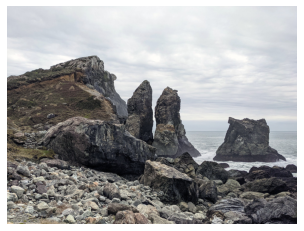

In [24]:
### 테스트 이미지 내려받기
from tensorflow import keras
import matplotlib.pyplot as plt

base_image_path = keras.utils.get_file(
     "coast.jpg", origin="https://img-datasets.s3.amazonaws.com/coast.jpg")

plt.axis("off")
plt.imshow(keras.utils.load_img(base_image_path)) 

In [25]:
### 사전 훈련된 InceptionV3 모델 로드
from tensorflow.keras.applications import inception_v3

# include_top=False : 위쪽 층 (DNN) 은 포함하지 않겠다는 의미
model = inception_v3.InceptionV3(weights="imagenet", include_top=False) 

87910968/87910968 [==============================] - 1s 0us/step


In [36]:
### 딥드림 손실에 대한 각 층의 기여도 설정

## 활성화를 최대화할 층과 전체 손실에 대한 가중치
# 경사 상승법 단계 동안에 최대화할 손실에 대한 각 층의 기여도에 가중치를 주기 위해 스칼라 값을 선택한다
layer_settings = {
    "mixed4": 1.0,
    "mixed5": 1.5,
    "mixed6": 2.0,
    "mixed7": 2.5,
}

## 각 층의 심볼릭 출력
outputs_dict = dict(
    [
        (layer.name, layer.output)
        for layer in [model.get_layer(name) for name in layer_settings.keys()]
    ]
)

## 다양한 중간층의 활성화 값을 (하나의 딕셔너리로) 반환하는 모델
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict) 

* 딥드림 손실 계산<br>
경사 상승법으로 각 스케일마다 최대화<br>
여러 층에 있는 모든 필터 활성화를 동시에 최대화

In [37]:
### 딥드림 손실
def compute_loss(input_image):
    features = feature_extractor(input_image)   # 활성화 추출
    loss = tf.zeros(shape=())                   # 손실을 0으로 초기화
    for name in features.keys():
        coeff = layer_settings[name]
        activation = features[name]
        # 경계부근의 인공적인 패턴을 피하기 위해 테두리가 아닌 픽셀만 손실에 추가
        loss += coeff * tf.reduce_mean(tf.square(activation[:, 2:-2, 2:-2, :]))

    return loss

In [38]:
### 딥드림 경사상승법 단계
import tensorflow as tf

@tf.function   # 데코레이터, 훈련 스텝의 속도를 높임
def gradient_ascent_step(image, learning_rate):
    ## 현재 이미지에 대한 딥드림 손실의 그레디언트 계산
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)   ## 그레디언트 정규화
    image += learning_rate * grads        # 미분한 값을 더한다
    
    return loss, image

# 주어진 이미지 스케일(옥타브)에 대한 경사 상승법 수행
def gradient_ascent_loop(image, iterations, learning_rate, max_loss=None):
    # 딥드림 손실을 증가시키는 방향으로, 반복적으로 이미지 업데이트
    for i in range(iterations):
        loss, image = gradient_ascent_step(image, learning_rate)
        # 손실이 일정 임계값을 넘으면 중지
        if max_loss is not None and loss > max_loss:
            break
        print(f"... 스텝 {i}에서 손실 값: {loss:.2f}")
        
    return image 

* 딥드림 과정 : 연속적으로 스케일을 늘리고(옥타브), 스케일이 중가된 이미지에 디테일을 재주입

In [39]:
### 파라미터 정의
step = 20.       # 경사 상승법 단계 크기
num_octave = 3   # 경사 상승법을 실행할 스케일(옥타브) 횟수
octave_scale = 1.4   # 각 스케일 사이의 이미지 증가 비율
iterations = 30  # 스케일 단계마다 수행할 경사 상승법 반복횟수
max_loss = 15.   # 손실 임계값 (이 값보다 손실이 커지면 경사 상승법 중지)

In [40]:
### 이미지 처리 유틸리티
import numpy as np

## 이미지 로드 및 적절한 배열로 변환 (크기 조정)
def preprocess_image(image_path):
    img = keras.utils.load_img(image_path)   # 이미지 로드
    img = keras.utils.img_to_array(img)      # 배열로 변환
    img = np.expand_dims(img, axis=0)        # 크기 조정
    img = keras.applications.inception_v3.preprocess_input(img)
    return img

## 넘파이 배열을 이미지로 변환
def deprocess_image(img):
    img = img.reshape((img.shape[1], img.shape[2], 3))
    
    # InceptionV3 전처리 복원
    img += 1.0
    img *= 127.5
    
    img = np.clip(img, 0, 255).astype("uint8")
    return img 

* 딥드림의 바깥쪽 루프<br>
스케일을 증가시킨 후 이미지에 손실된 디테일을 재주입한다<br>
큰 이미지 크기 L 로 변경된 원본 이미지와, 작은 이미지 크기 S 로 변경된 원본 이미지 사이의 '차이' 를 계산한다<br>
이 차이는 S 에서 L 로 변경될 때 잃어버린 디테일 이다

In [41]:
### 연속적인 여러개의 '옥타브' 에 걸처 경사 상승법 실행
'''
### 파라미터 정의
step = 20.       # 경사 상승법 단계 크기
num_octave = 3   # 경사 상승법을 실행할 스케일(옥타브) 횟수
octave_scale = 1.4   # 각 스케일 사이의 이미지 증가 비율
iterations = 30  # 스케일 단계마다 수행할 경사 상승법 반복횟수
max_loss = 15.   # 손실 임계값 (이 값보다 손실이 커지면 경사 상승법 중지)
'''

original_img = preprocess_image(base_image_path)   # 테스트 이미지 로드
original_shape = original_img.shape[1:3]

## 여러 옥타브 에서 이미지 크기 계산
successive_shapes = [original_shape]
for i in range(1, num_octave):
    shape = tuple([int(dim / (octave_scale ** i)) for dim in original_shape])
    successive_shapes.append(shape)
successive_shapes = successive_shapes[::-1]

shrunk_original_img = tf.image.resize(original_img, successive_shapes[0])

## 이미지 복사 (원본 이미지는 그대로 보관)
img = tf.identity(original_img)

## 여러 옥타브에 대해 반복
for i, shape in enumerate(successive_shapes):
    print(f"{shape} 크기의 {i}번째 옥타브 처리")
    img = tf.image.resize(img, shape)   # 딥드림 이미지의 스케일 증가
    img = gradient_ascent_loop(    # 경사 상승법을 실행하고 딥드림 이미지 수정
        img, iterations=iterations, learning_rate=step, max_loss=max_loss
    )
    upscaled_shrunk_original_img = tf.image.resize(shrunk_original_img, shape)  #작은 버전의 원본 이미지 스케일 증가
    same_size_original = tf.image.resize(original_img, shape)    # 이 크기에 해당하는 고해상도 버전의 원본 이미지 계산
    lost_detail = same_size_original - upscaled_shrunk_original_img   # 손실된 디테일 (두 이미지의 차이)
    img += lost_detail   # 손실된 딥드림을 이미지에 다시 주입
    shrunk_original_img = tf.image.resize(original_img, shape)

keras.utils.save_img("dream.png", deprocess_image(img.numpy())) 

(459, 612) 크기의 0번째 옥타브 처리
... 스텝 0에서 손실 값: 0.80
... 스텝 1에서 손실 값: 1.07
... 스텝 2에서 손실 값: 1.44
... 스텝 3에서 손실 값: 1.82
... 스텝 4에서 손실 값: 2.16
... 스텝 5에서 손실 값: 2.49
... 스텝 6에서 손실 값: 2.84
... 스텝 7에서 손실 값: 3.17
... 스텝 8에서 손실 값: 3.53
... 스텝 9에서 손실 값: 3.85
... 스텝 10에서 손실 값: 4.22
... 스텝 11에서 손실 값: 4.57
... 스텝 12에서 손실 값: 4.93
... 스텝 13에서 손실 값: 5.31
... 스텝 14에서 손실 값: 5.67
... 스텝 15에서 손실 값: 6.01
... 스텝 16에서 손실 값: 6.41
... 스텝 17에서 손실 값: 6.70
... 스텝 18에서 손실 값: 7.08
... 스텝 19에서 손실 값: 7.40
... 스텝 20에서 손실 값: 7.73
... 스텝 21에서 손실 값: 8.06
... 스텝 22에서 손실 값: 8.37
... 스텝 23에서 손실 값: 8.67
... 스텝 24에서 손실 값: 8.97
... 스텝 25에서 손실 값: 9.21
... 스텝 26에서 손실 값: 9.56
... 스텝 27에서 손실 값: 9.82
... 스텝 28에서 손실 값: 10.09
... 스텝 29에서 손실 값: 10.34
(642, 857) 크기의 1번째 옥타브 처리
... 스텝 0에서 손실 값: 1.61
... 스텝 1에서 손실 값: 2.66
... 스텝 2에서 손실 값: 3.48
... 스텝 3에서 손실 값: 4.09
... 스텝 4에서 손실 값: 4.60
... 스텝 5에서 손실 값: 5.06
... 스텝 6에서 손실 값: 5.54
... 스텝 7에서 손실 값: 5.94
... 스텝 8에서 손실 값: 6.35
... 스텝 9에서 손실 값: 6.73
... 스텝 10에서 손실 값: 7.09
... 스텝 11에서 손실 값: 7.41


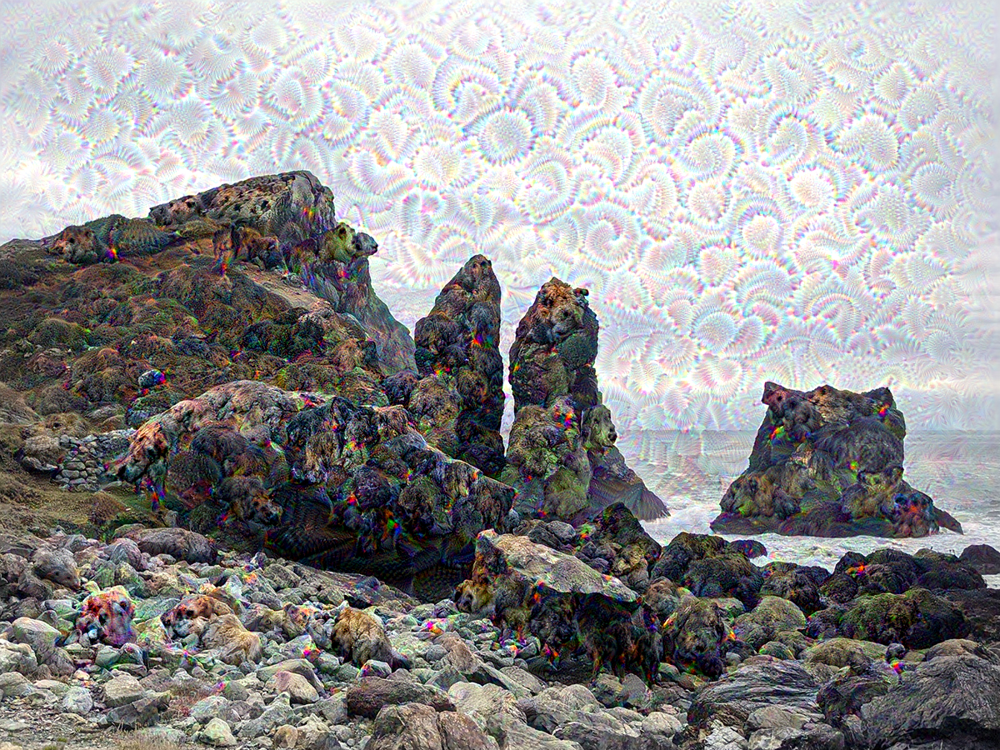

In [42]:
### 딥드림 수행 결과 확인
keras.utils.load_img("dream.png")

## 12-3. 뉴럴 스타일 트랜스퍼
뉴럴 스타일 트랜스퍼는 원본 이미지의 콘텐츠를 보존하면서 참조 이미지의 스타일을 원본 이미지에 적용한다<br>
(참조 이미지의 '스타일' : 질감, 색깔, 다양한 크기의 시각 요소)

In [44]:
### 스타일 이미지와 콘텐츠 이미지 준비
from tensorflow import keras

## 콘텐츠 이미지
base_image_path = keras.utils.get_file(
    "sf.jpg", origin="https://img-datasets.s3.amazonaws.com/sf.jpg")

## 스타일 이미지
style_reference_image_path = keras.utils.get_file(
    "starry_night.jpg",
    origin="https://img-datasets.s3.amazonaws.com/starry_night.jpg")

original_width, original_height = keras.utils.load_img(base_image_path).size

## 생성 이미지의 차원
img_height = 400
img_width = round(original_width * img_height / original_height)

943128/943128 [==============================] - 1s 1us/step


In [45]:
### 이미지 처리 함수
import numpy as np

## 이미지 로드 및 적절한 배열로 변환 (크기 조정)
def preprocess_image(image_path):
    img = keras.utils.load_img(image_path,
                               target_size=(img_height, img_width))   # 이미지 로드
    img = keras.utils.img_to_array(img)      # 배열로 변환
    img = np.expand_dims(img, axis=0)        # 크기 조정
    img = keras.applications.vgg19.preprocess_input(img)
    return img

## 넘파이 배열을 이미지로 변환
def deprocess_image(img):
    img = img.reshape((img_height, img_width, 3))
    
    ## vgg19.preprocess_input() 함수에서 수행한 변환 복원
    # ImageNet 의 평균 픽셀값을 더한다
    img[:, :, 0] += 103.939
    img[:, :, 1] += 116.779
    img[:, :, 2] += 123.68
    
    # 이미지를 'BGR' 에서 'RGB' 로 변경
    img = img[:, :, ::-1]
    
    img = np.clip(img, 0, 255).astype("uint8")
    return img 

In [46]:
### 사전 훈련된 VGG19 모델에 있는 모든 층을 사용하여 특성 추출기 만들기

## ImageNet 에서 사전 훈련된 가중치로 VGG19 모델 생성
model = keras.applications.vgg19.VGG19(weights='imagenet', include_top=False)

outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

## 모든 타깃층의 활성화 값 (딕셔너리)
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

80134624/80134624 [==============================] - 2s 0us/step


VGG19 컨브넷의 상위 층은 베이스 이미지와 생성된 이미지에서 동일해야한다

In [51]:
### 콘텐츠 손실
def content_loss(base_img, combination_img):
    return tf.reduce_sum(tf.square(combination_img - base_img))


### 스타일 손실
def gram_matrix(x):
    x = tf.transpose(x, (2,0,1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    gram = tf.matmul(features, tf.transpose(features))
    return gram

def style_loss(style_img, combination_img):
    S = gram_matrix(style_img)
    C = gram_matrix(combination_img)
    channels = 3
    size = img_height * img_width
    return tf.reduce_sum(tf.square(S-C)) / (4.0 * (channels**2) * (size**2))


### 총 변위 손실
# 일종의 규제, 생성된 이미지가 공간적인 연속성을 갖게 해주며, 픽셀의 격자 무늬가 과도하게 나타는것을 방지
def total_variation_loss(x):
    a = tf.square(
        x[:, : img_height - 1, : img_width - 1, :] - x[:, 1:, : img_width - 1, :]
    )
    b = tf.square(
        x[:, : img_height - 1, : img_width - 1, :] - x[:, : img_height - 1, 1:, :]
    )
    return tf.reduce_sum(tf.pow(a + b, 1.25))

최소화할 손실은 이 세 손실의 가중치 평균 이다<br>
콘텐츠 손실은 block5_conv2 층 하나만 사용해서 계산하고,<br>
스타일 손실은 하위 층과 상위 층에 걸쳐 여러 층을 사용하여 계산한다<br>
그리고 마지막에 총 변위 손실을 추가한다<br>

사용하는 스타일 참조 이미지와 콘텐츠 이미지에 따라 content_weight 계수<br>
(콘텐츠 손실이 전체 손실에 기여하는 정도) 를 조정하는 것이 좋다<br>
content_weight 이 높으면 생성된 이미지에 타깃 콘텐츠가 더 많이 나타난다

In [48]:
### 최소화할 최종 손실 정의하기

## 스타일 손실에 사용할 층
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]

## 콘텐츠 손실에 사용할 층
content_layer_name = "block5_conv2"

## 총변이 손실의 기여 가중치
total_variation_weight = 1e-6
## 스타일 손실의 기여 가중치
style_weight = 1e-6
## 콘텐츠 손실의 기여 가중치
content_weight = 2.5e-8


def compute_loss(combination_image, base_image, style_reference_image):
    input_tensor = tf.concat(
        [base_image, style_reference_image, combination_image], axis=0
    )
    features = feature_extractor(input_tensor)
    
    ## 손실을 0 으로 초기화
    loss = tf.zeros(shape=())
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    
    ## 콘텐츠 손실을 더한다
    loss = loss + content_weight * content_loss(
        base_image_features, combination_features
    )
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        style_loss_value = style_loss(
          style_reference_features, combination_features)
        
        ## 스타일 손실을 더한다
        loss += (style_weight / len(style_layer_names)) * style_loss_value
    
    ## 총 변위 손실을 더한다
    loss += total_variation_weight * total_variation_loss(combination_image)
    return loss

In [ ]:
### 경사 하강법
import tensorflow as tf

@tf.function    # 데코레이터, 훈련 스텝의 속도를 높인다
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image)
    grads = tape.gradient(loss, combination_image)
    return loss, grads

optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(   # 학습률 100 에서 시작하여 100 스텝마다 4% 씩 감소
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96
    )
)

base_image = preprocess_image(base_image_path)
style_reference_image = preprocess_image(style_reference_image_path)
combination_image = tf.Variable(preprocess_image(base_image_path))

iterations = 4000
for i in range(1, iterations + 1):
    loss, grads = compute_loss_and_grads(
        combination_image, base_image, style_reference_image
    )
    
    # 스타일 트랜스퍼 손실이 감소되는 방향으로 합성 이미지 업데이트
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print(f"{i}번째 반복: loss={loss:.2f}")
        img = deprocess_image(combination_image.numpy())
        fname = f"combination_image_at_iteration_{i}.png"
        keras.utils.save_img(fname, img)

In [ ]:
### 수행 결과 확인
keras.utils.load_img(fname)

## 12-4. 변이형 오토인코더를 사용한 이미지 생성

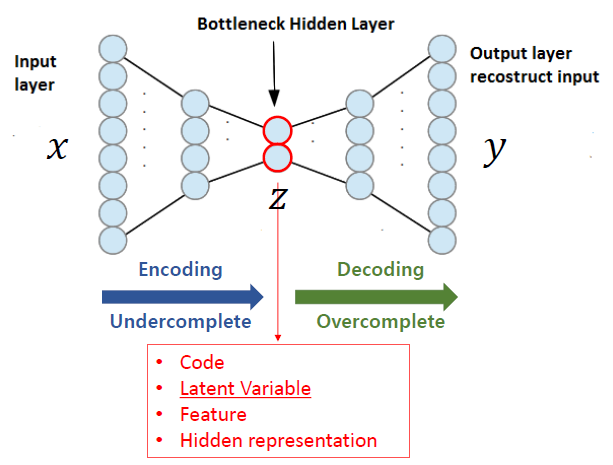

### * 오토 인코더
이미지를 입력받아 인코더 모듈을 사용하여 잠재 백터 공간으로 매핑한다<br>
그다음 디코더 모듈을 사용해서 '원본 이미지와 동일한 차원으로 복원하여' 출력한다<br>

오토인코더는 입력 이미지와 동일한 이미지를 타깃 데이터로 사용하여 훈련한다(타깃 데이터가 따로 있지 않다)<br>
즉 원본 입력을 '재구성' 하는 방법을 학습하는 것이다<br>

코딩(인코더의 출력) 에 여러 제약을 가하면 오토인코더가 더 흥미로운 또는 덜 흥미로운 잠재 공간의 표현을 학습한다<br>
일반적으로는 코딩이 저차원이고 희소하도록(0이 많도록) 제약을 가한다<br>
이런 경우 인코더는 입력 데이터의 정보를 적은 수의 비트에 압축하기 위해 노력한다<br>
(중요하다고 생각하는 것만 기억하고, 그렇지 않은 것은 버린다)

### * VAE
VAE 는 오토인코더에 약간의 '통계 기법' 을 추가하여 연속적이고 구조적인 잠재 공간을 학습한다<br>
이미지를 어떤 통계 분포의 파라미터로 변환하며, 이는 입력 이미지가 통계적 과정을 통해 생성되었다고 가정하여<br>
인코딩과 디코딩을 하는 동안 무작위성이 필요하다는 것을 의미한다<br>

'평균' 과 '분산' 파라미터를 사용하여 무작위로 하나의 샘플을 추출하고,<br>
이 샘플을 디코딩하여 원본 입력으로 복원한다<br>

* 잠재 공간 (latent space)<br>
머신러닝에서 잠재 공간은 직접 관찰할 수 없는 숨겨진 공간을 말한다<br>
비슷한 샘플 데이터는 잠재 공간에서 가까운 위치에 놓인다

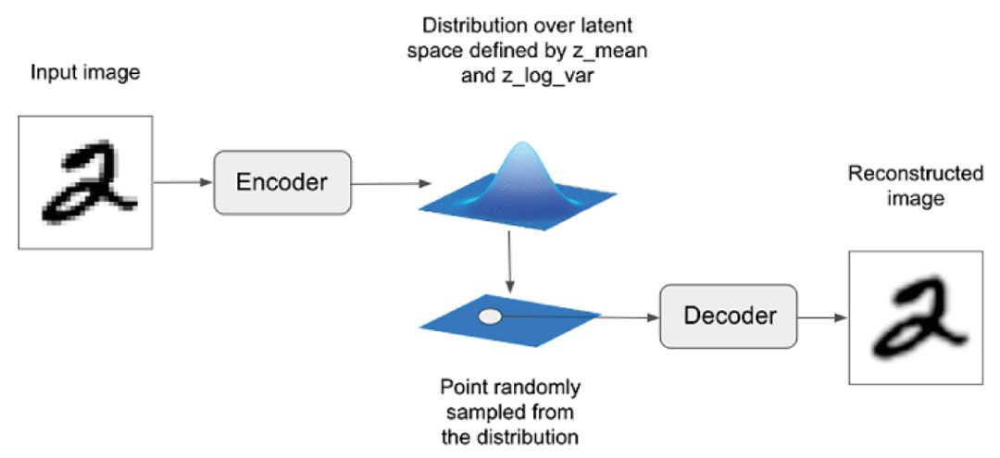

* VAE 작동 순서<br>
① 인코더 모듈이 입력 샘플(input image)을 잠재 공간의 두 파라미터 z_mean(평균) 과 z_log_var(분산) 로 변환한다<br>
② 입력 이미지가 생성되었다고 가정한 잠재 공간의 정규 분포에서 포인트 z 를<br>
z = z_mean + exp(0.5*z_log_var) * epsilon 처럼 무작위로 샘플링한다 (epsilon : 작은 값을 가진 랜덤 텐서)<br>
③ 디코더 모듈은 포인트 z 를 원본 입력 이미지로 매핑하여 복원한다

VAE 의 파라미터는 2개의 손실함수로 훈련한다<br>
- 재구성 손실 : 원본 입력과 동일하도록 만듬<br>
- 규제 손실 : 잠재 공간을 잘 형성하고 훈련 데이터에 과대적합 감소

In [ ]:
# 입력을 평균과 분산 파라미터로 인코딩
z_mean, z_log_var = encoder(input_img)

# 랜덤한 작은 epsilon 값을 사용하여 잠재 공간의 포인트 z 추출
z = z_mean + exp(0.5*z_log_var) * epsilon

# z를 이미지로 디코딩
reconstructed_img = decoder(z)

# 입력 이미지와 재구성 이미지를 매핑한 오코인코더 모델 객체 생성
model = Model(input_img, reconstructed_img)

### (4) 케라스로 VAE 구현하기<br>
#### * MNIST 숫자를 생성할 수 있는 VAE 구현하기
- 인코더 네트워크는 실제 이미지를 잠재 공간의 평균과 분산으로 변환한다<br>
- 샘플링 층은 평균과 분산을 받아 잠재 공간에서 랜덤한 포인트를 샘플링 한다<br>
- 디코더 네트워크는 잠재 공간의 포인트를 이미지로 변환한다

In [53]:
### VAE 인코더 네트워크
from tensorflow import keras
from tensorflow.keras import layers

latent_dim = 2    # 잠재 공간의 차원 : 2D 평면

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(filters=32, kernel_size=3,
                  activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(filters=64, kernel_size=3,
                  activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(units=16, activation="relu")(x)

# 평균과 분산 2개의 파라미터로 인코딩
z_mean = layers.Dense(units=latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(units=latent_dim, name="z_log_var")(x)

encoder = keras.Model(encoder_inputs, [z_mean, z_log_var], name="encoder")

In [54]:
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 conv2d_96 (Conv2D)             (None, 14, 14, 32)   320         ['input_8[0][0]']                
                                                                                                  
 conv2d_97 (Conv2D)             (None, 7, 7, 64)     18496       ['conv2d_96[0][0]']              
                                                                                                  
 flatten_1 (Flatten)            (None, 3136)         0           ['conv2d_97[0][0]']              
                                                                                            

In [55]:
### 잠재 공간 샘플링 (포인트 z 생성)
import tensorflow as tf

class Sampler(layers.Layer):
    def call(self, z_mean, z_log_var):
        batch_size = tf.shape(z_mean)[0]
        z_size = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch_size, z_size))  # 정규 분포를 따르는 랜덤한 벡터 배치
        
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon   # VAE 샘플링 적용

In [58]:
### VAR 디코더 네트워크 (잠재 공간 포인트를 이미지로 매핑)
latent_inputs = keras.Input(shape=(latent_dim, ))   # z 를 입력으로 사용

x = layers.Dense(units=7*7*64, activation="relu")(latent_inputs)   # 인코더에 있는 Flatten 층의 출력 크기와 동일하게 지정
x = layers.Reshape((7, 7, 64))(x)    # 인코더의 Flatten 층 작업을 되돌림

# 인코더의 Conv2D 층 작업을 되돌림
x = layers.Conv2DTranspose(filters=64, kernel_size=3,
                           activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(filters=32, kernel_size=3,
                           activation="relu", strides=2, padding="same")(x)

decoder_outputs = layers.Conv2D(filters=1, kernel_size=3,
                                activation="sigmoid", padding="same")(x)

decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder") 

In [59]:
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 2)]               0         
                                                                 
 dense_5 (Dense)             (None, 3136)              9408      
                                                                 
 reshape_1 (Reshape)         (None, 7, 7, 64)          0         
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 14, 14, 64)       36928     
 ranspose)                                                       
                                                                 
 conv2d_transpose_3 (Conv2DT  (None, 28, 28, 32)       18464     
 ranspose)                                                       
                                                                 
 conv2d_99 (Conv2D)          (None, 28, 28, 1)         289 

오토인코더는 입력을 타깃으로 사용하는 '자기지도학습' 의 한 예이다

In [60]:
### 사용자 정의 train_step() 메서드를 사용하는 VAE 모델

class VAE(keras.Model):    # Model 클래스 상속
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.sampler = Sampler()
        
        ## 에포크 마다 클래스 내에서 손실 평균 측정
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    ## fit()과 evaluate() 호출 사이에 모델이 손실을 재설정할 수 있도록
    ## metrics 속성에 손실을 나열한다
    def metrics(self):
        return [self.total_loss_tracker,
                self.reconstruction_loss_tracker,
                self.kl_loss_tracker]
    
    # fit() 을 실행하면 실행되는 함수 train_step()
    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var = self.encoder(data)
            z = self.sampler(z_mean, z_log_var)
            reconstruction = decoder(z)
            
            # 공간 차원(축1과 2)에 대해 재구성 손실을 더하고, 배치 차원에 대해 평균 계산
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction),
                    axis=(1, 2)
                )
            )
            
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            total_loss = reconstruction_loss + tf.reduce_mean(kl_loss)   #규제 항을 더한다
        
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        
        return {
            "total_loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        } 

In [ ]:
### VAE 훈련
# 사용자 정의 층(train_step) 에서 손실을 관리하므로 compile() 메서드에 별도의 손실을 지정하지 않는다 (loss=None)
# (훈련할 때 타깃 데이터를 전달하지 않는다는 의미)

import numpy as np

(x_train, _), (x_test, _) = keras.datasets.mnist.load_data()
# 훈련에 사용할 전체 MNIST 숫자 데이터 생성
mnist_digits = np.concatenate([x_train, x_test], axis=0)
mnist_digits = np.expand_dims(mnist_digits, -1).astype('float32') / 255

vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam(), run_eagerly=True)
vae.fit(mnist_digits, epochs=30, batch_size=128)

In [ ]:
### 2D 잠재 공간에서 이미지 그리드 샘플링
import matplotlib.pyplot as plt

n = 30   # 30x30 크기의 숫자 그리드 출력
digit_size = 28
figure = np.zeros((digit_size * n, digit_size * n))

# 2D 그리드에서 선형적으로 포인트 샘플링
grid_x = np.linspace(-1, 1, n)
grid_y = np.linspace(-1, 1, n)[::-1]

# 그리드 위치에 대해 반복 (셀에 있는 것을 하나씩 가져옴)
for i, yi in enumerate(grid_y):
    for j, xi in enumerate(grid_x):
        # 각 위치에서 숫자를 샘플링하여 그림에 추가
        z_sample = np.array([[xi, yi]])
        x_decoded = vae.decoder.predict(z_sample)
        digit = x_decoded[0].reshape(digit_size, digit_size)
        
        figure[
            i * digit_size : (i + 1) * digit_size,
            j * digit_size : (j + 1) * digit_size,
        ] = digit

## 시각화
plt.figure(figsize=(15, 15))
start_range = digit_size // 2
end_range = n * digit_size + start_range
pixel_range = np.arange(start_range, end_range, digit_size)
sample_range_x = np.round(grid_x, 1)
sample_range_y = np.round(grid_y, 1)
plt.xticks(pixel_range, sample_range_x)
plt.yticks(pixel_range, sample_range_y)
plt.xlabel("z[0]")
plt.ylabel("z[1]")
plt.axis("off")
plt.imshow(figure, cmap="Greys_r")
plt.show()

### (5) 활용 - 오토인코더를 사용한 이상 탐지
정상인 데이터들 중에 소수의 비정상인 데이터가 포함되어 있다.<br>
AutoEncoder를 사용하여 학습 시킨다.<br>
이렇게 학습된 AutoEncoder는 대부분의 정상 데이터에 대하여 복원 능력이 있다. 하지만 소소의 비정상 데이터에 대해서는 제대로 복원하지 못한다.<br>
이렇게 학습시킨 AutoEncoder를 가지고 특정영상을 복원 하게 하고 그 복원 결과가 좋지 않을 경우 정상영상이 아니라고 판정한다.<br>

originality from <br>
https://www.pyimagesearch.com/2020/03/02/anomaly-detection-with-keras-tensorflow-and-deep-learning/

In [ ]:
pip install opencv-python

In [ ]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Reshape
from tensorflow.keras.layers import Input
from tensorflow.keras import Model
from tensorflow.keras import backend as K
import numpy as np

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.datasets import mnist
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np

import random
import pickle
import cv2
import matplotlib 

In [ ]:
# 데이터 준비

## 데이터 로딩
((trainX, trainY), (testX, testY)) = mnist.load_data()

## 데이터셋 생성
# 1의 레이블 영상이 정상이고 3의 레이블 영상을 비정상으로 한다.
# 정상 영상과 비정상 영상의 비율을 100:1로 해서 골라내고, 골고루 섞은 데이터셋을 만든다.

def build_unsupervised_dataset(data, labels, validLabel=1, anomalyLabel=3, contam=0.01, seed=42):
    # 레이블 1인 영상의 인덱스
    validIdxs = np.where(labels == validLabel)[0]
    # 레이블 3인 영상의 인덱스
    anomalyIdxs = np.where(labels == anomalyLabel)[0]

    # 무작위로 섞어 주고
    random.shuffle(validIdxs)
    random.shuffle(anomalyIdxs)

    # 비정상 데이터의 갯수를 비정상 데이터 갯수 대비 0.01(contam)로 한다.
    i = int(len(validIdxs) * contam)
    anomalyIdxs = anomalyIdxs[:i]

    print("len(validIdx)=",len(validIdxs))
    print("len(anomalyIdxs)=",len(anomalyIdxs))

    # 추려낸 정상 데이터와 비정상 제이터
    validImages = data[validIdxs]
    anomalyImages = data[anomalyIdxs]

    # 두개의 데이터를 합하고, 다시 섞어주고
    images = np.vstack([validImages, anomalyImages])
    np.random.seed(seed)
    np.random.shuffle(images)

    return images

In [ ]:
images = build_unsupervised_dataset(trainX, trainY,
                                    validLabel=1, anomalyLabel=3, contam=0.01)

images = np.expand_dims(images, axis=-1)
images = images.astype("float32") / 255.0 

print(images.shape)
print(np.max(images))
print(np.min(images)) 

In [ ]:
## 데이터 모양 변경, Normalization
# Conv2D 사용을 위해 데이터 모양을 (H, W, channel)의 3차원으로 만들고 (28, 28) -> (28, 28, 1)
# 0 ~ 1.0으로 normlaization 한다.

images = np.expand_dims(images, axis=-1)
images = images.astype("float32") / 255.0

print(images.shape)
print(np.max(images))
print(np.min(images))

In [ ]:
## 데이터 분리
(trainX, testX) = train_test_split(images, test_size=0.2, random_state=42)

print(trainX.shape)
print(testX.shape)

print(trainX.shape)
print(testX.shape)

for i in range(10):
    plt.imshow(trainX[i].reshape((28,28)))
    plt.show()

In [ ]:
# 학습
## 모델 정의

class ConvAutoencoder:

    @staticmethod
    def build(width, height, depth, filters=(32, 64), latentDim=16):
        inputShape = (height, width, depth)
        chanDim = -1

        inputs = Input(shape=inputShape)
        x = inputs

        for f in filters:
            # apply a CONV => RELU => BN operation
            x = Conv2D(f, (3, 3), strides=2, padding="same")(x)
            x = LeakyReLU(alpha=0.2)(x)
            x = BatchNormalization(axis=chanDim)(x)

        volumeSize = K.int_shape(x)
        x = Flatten()(x)
        latent = Dense(latentDim)(x)

        encoder = Model(inputs, latent, name="encoder")

        latentInputs = Input(shape=(latentDim,))
        x = Dense(np.prod(volumeSize[1:]))(latentInputs)
        x = Reshape((volumeSize[1], volumeSize[2], volumeSize[3]))(x)

        for f in filters[::-1]:
            # apply a CONV_TRANSPOSE => RELU => BN operation
            x = Conv2DTranspose(f, (3, 3), strides=2, padding="same")(x)
            x = LeakyReLU(alpha=0.2)(x)
            x = BatchNormalization(axis=chanDim)(x)

        x = Conv2DTranspose(depth, (3, 3), padding="same")(x)
        outputs = Activation("sigmoid")(x)

        decoder = Model(latentInputs, outputs, name="decoder")
        autoencoder = Model(inputs, decoder(encoder(inputs)), name="autoencoder")

        return autoencoder

In [ ]:
## 모델 생성
autoencoder = ConvAutoencoder.build(28, 28, 1)
autoencoder.summary()

## 모델 컴파일
# decay값은 1 step 마다 감소하는 비율
opt = Adam(learning_rate=1e-3, decay=0.0025)
autoencoder.compile(loss="mse", optimizer=opt)

## 학습
history = autoencoder.fit(trainX, trainX,
                          validation_split=0.1,
                          epochs=20,
                          batch_size=32)

N = np.arange(len(history.history['loss']))

plt.style.use("ggplot")
plt.figure()
plt.plot(N, history.history["loss"], label="train_loss")
plt.plot(N, history.history["val_loss"], label="val_loss")
plt.title("Training Loss")
plt.xlabel("Epoch #")
plt.ylabel("Loss")
plt.legend(loc="lower left")

In [ ]:
## 테스트 데이터에 대한 복원 실행
reconstructed = autoencoder.predict(testX)

for i in range(10):
    combined = np.hstack([testX[i], reconstructed[i]])
    plt.imshow(combined.squeeze())
    plt.show()

* 이상 탐지<br>
학습된 AutoEncoder는 1 영상(정상 영상)의 경우 잘 복원한다. 그러나 그렇지 않은 경우 잘 복원하지 못한다.<br>
1의 영상은 정상이고, 3의 영상은 비정상이다. 또한 1이외의 정상 역시 비정상이다.<br>
AutoEncoder를 사용하여 인코딩과 디코딩을 통해 복원하고, 복원된 것이 원본과 차이가 날 수록 비정상인것으로 판단한다.

In [ ]:
## 복원 실행
reconstructed = autoencoder.predict(testX)

## 차이 계산
errors = []

for (image, recon) in zip(testX, reconstructed):
    # compute the mean squared error between the ground-truth image
    # and the reconstructed image, then add it to our list of errors
    mse = np.mean((image - recon) ** 2)
    errors.append(mse)

plt.hist(errors, bins=100)
plt.show()

In [ ]:
# 데이터의 1/101이 비정상 데이터이다.
# quantile 0.99 이상이 되는 threshold를 구하자.

threshold = np.quantile(errors, 0.99)
print(threshold)

anomaly_idxs = np.where(np.array(errors) >= threshold)[0]
print(len(anomaly_idxs))

for i in anomaly_idxs:
    combined = np.hstack([testX[i], reconstructed[i]])
    plt.imshow(combined.squeeze())
    plt.show()
    
# 비정상 영상인 3자와, 정말 이상하게 생긴 1자를 잘 찾아 냈다.

In [ ]:
# 1과 3 이외의 입력

((trainX, trainY), (testX, testY)) = mnist.load_data()

testX = np.expand_dims(testX, axis=-1)
testX = testX.astype("float32") / 255.0

print(testX.shape)
print(reconstructed.shape)

reconstructed = autoencoder.predict(testX)

for i in range(30):
    combined = np.hstack([testX[i], reconstructed[i]])
    plt.imshow(combined.squeeze())
    plt.show() 

# 221208 Day73

## Fashion MNIST Data
CNN 을 사용하여 fashion mnist 를 분류하고 test_set accuracy 구하기

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
import keras
from keras import Sequential
from keras import layers
from keras import optimizers
from keras.layers import Input, Dense

In [3]:
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Input, Rescaling, Conv2D, MaxPooling2D, Dense, Flatten

In [8]:
import tensorflow as tf
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

In [9]:
print(train_images.shape)
print(train_labels.shape)
print(test_images.shape)
print(test_labels.shape)

(60000, 28, 28)
(60000,)
(10000, 28, 28)
(10000,)


In [10]:
train_img = train_images.reshape((60000, 28, 28, 1))   # 채널 축(1) 추가
train_img = train_images.astype('float32') / 255

test_images = test_images.reshape((10000, 28, 28, 1))
test_images = test_images.astype("float32") / 255

from sklearn.model_selection import train_test_split
train_images, val_images, train_labels, val_labels = train_test_split(
    train_img, train_labels, test_size=0.3)

In [ ]:
np.random.permutation(60000)

array([41594, 26395, 49471, ...,  9160, 25377, 32107])

In [ ]:
# train, validation 세트를 분리하는 다른 방법
train_img = train_images.reshape((60000, 28, 28, 1))   # 채널 축(1) 추가
train_img = train_images.astype('float32') / 255

numbers = np.random.permutation(train_images.shape[0])   # train_images.shape[0] = 60000
indices = int(numbers*0.7)

train_images = train_img[:indices, :, :]
val_images = train_img[indices:, :, :]
train_labels = train_labels[:indices]
val_labels = val_labels[indices:]

In [13]:
inputs = keras.Input(shape = (28, 28, 1))

x = layers.Conv2D(filters=32, kernel_size=3, activation='relu')(inputs)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation='relu')(x)
x = layers.Flatten()(x)

#x = layers.Dense(units=32, activation='relu')(x)
#x = layers.Dense(units=20, activation='relu')(x)

outputs = layers.Dense(units=10, activation='softmax')(x)

model = keras.Model(inputs, outputs)

In [22]:
model.compile(optimizer='rmsprop',
             loss='sparse_categorical_crossentropy',
             metrics='accuracy')

callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath="fashion_mnist.keras",
      save_best_only=True,
      monitor="val_loss")
]

history = model.fit(train_images, train_labels,
                    epochs=5, batch_size=128,
                    callbacks=callbacks,
                    validation_data=(val_images, val_labels))

model = keras.models.load_model("fashion_mnist.keras")
test_loss, test_acc = model.evaluate(test_images, test_labels)
print(f'테스트 정확도:, {test_acc:.3f}')

Epoch 1/5
329/329 [==============================] - 19s 54ms/step - loss: 0.1822 - accuracy: 0.9340 - val_loss: 0.3156 - val_accuracy: 0.8921
Epoch 2/5
329/329 [==============================] - 18s 54ms/step - loss: 0.1675 - accuracy: 0.9396 - val_loss: 0.2688 - val_accuracy: 0.9067
Epoch 3/5
329/329 [==============================] - 18s 54ms/step - loss: 0.1536 - accuracy: 0.9447 - val_loss: 0.3104 - val_accuracy: 0.8948
Epoch 4/5
329/329 [==============================] - 17s 52ms/step - loss: 0.1416 - accuracy: 0.9483 - val_loss: 0.2769 - val_accuracy: 0.9068
Epoch 5/5
313/313 [==============================] - 1s 4ms/step - loss: 0.2771 - accuracy: 0.9014
테스트 정확도:, 0.901


In [24]:
history.history

{'loss': [0.18220052123069763,
  0.16752414405345917,
  0.1535988599061966,
  0.1415529102087021,
  0.13104873895645142],
 'accuracy': [0.9340237975120544,
  0.9395714402198792,
  0.944690465927124,
  0.9483333230018616,
  0.9525952339172363],
 'val_loss': [0.3156408369541168,
  0.26881569623947144,
  0.3104415535926819,
  0.27691182494163513,
  0.29631462693214417],
 'val_accuracy': [0.8921111226081848,
  0.9067222476005554,
  0.8948333263397217,
  0.9068333506584167,
  0.9073333144187927]}

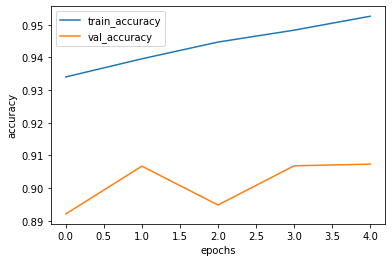

In [23]:
plt.plot(history.history['accuracy'], label='train_accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

In [ ]:
##### < 코드 총 정리 > #####

### 1. Fashion MNIST 데이터셋 불러오기
import tensorflow as tf
fashion_mnist = tf.keras.datasets.fashion_mnist
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()


### 2. 훈련, 검증, 테스트 세트
train_img = train_images.reshape((60000, 28, 28, 1))   # 채널 축(1) 추가
train_img = train_images.astype('float32') / 255

test_images = test_images.reshape((10000, 28, 28, 1))
test_images = test_images.astype("float32") / 255

# train_test_split : '원본 데이터를 섞은 후' 나눈다
from sklearn.model_selection import train_test_split
train_images, val_images, train_labels, val_labels = train_test_split(
    train_img, train_labels, test_size=0.3)


### 3. 모델 생성
inputs = Input(shape = (28, 28, 1))

x = layers.Conv2D(filters=32, kernel_size=3, activation='relu')(inputs)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation='relu')(x)
x = layers.Flatten()(x)

#x = Dense(units=32, activation='relu')(x)
#x = Dense(units=20, activation='relu')(x)

outputs = layers.Dense(units=10, activation='softmax')(x)

model = keras.Model(inputs, outputs)


### 4. 모델 컴파일, 훈련 및 평가
model.compile(optimizer='rmsprop',
             loss='sparse_categorical_crossentropy',
             metrics='accuracy')

callbacks = [
    keras.callbacks.ModelCheckpoint(
      filepath="fashion_mnist.keras",
      save_best_only=True,
      monitor="val_loss")
]

history = model.fit(train_images, train_labels,
                    validation_data=(val_images, val_labels),
                    epochs=5, batch_size=200)

model = keras.model.load_model("fashion_mnist.keras")
test_loss, test_acc = model.evaluate(test_images, test_labels)
print(f'테스트 정확도:, {test_acc:.3f}')


### 5. 시각화
plt.plot(history.history['accuracy'], label='train_accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

## 12-5. 생성적 적대 신경망 (GAN)

# 221209 Day74

## < 복습 >

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

### * 딥러닝 기본 모델

In [1]:
import tensorflow as tf

In [7]:
# mnist 데이터셋 로드
mnist = tf.keras.datasets.mnist

(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

# 0~1 사이로 데이터 스케일 조정
train_images = train_images / 255.
test_images = test_images / 255.

In [8]:
print(train_images.shape)
print(test_images.shape)

(60000, 28, 28)
(10000, 28, 28)


In [10]:
import keras
from keras import Sequential, models, layers, optimizers
from keras.layers import Input, Dense

In [13]:
# keras 에서 mnist 데이터셋 로드
from keras.datasets import mnist
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

train_images = train_images.reshape((60000, 28*28))
train_images = train_images.astype('float32')/255

test_images = test_images.reshape((10000, 28*28))
test_images = test_images.astype('float32')/255

print(len(train_images[0]))
print(train_images.shape)
print(test_images.shape)

784
(60000, 784)
(10000, 784)


In [18]:
# Sequential 모델
model = keras.Sequential([
    layers.Dense(units=512, activation='relu'),
    layers.Dense(units=10, activation='softmax')
])   # 최종 output 은 10개(units=10) (mnist는 0~9의 총 10개로 분류하는 것이 목표)

# 모델 컴파일
model.compile(optimizer="rmsprop",
              loss="sparse_categorical_crossentropy",   # 다중 분류 (이진분류는 binary_crossentropy)
              metrics="accuracy")

* 활성화 함수로 'relu' 를 사용한 이유<br>
선형 변환만 한다면 모델을 아무리 쌓아도 (계속 선형이라) 다양한 처리를 하기 어렵지만<br>
비선형 변환 (relu) 을 함으로써 일종의 변환을 주어 모델이 쌓일수록 보다 더 다양한 처리를 할 수 있게 된다

* softmax : 다중 분류<br>
확률값을 반환, 확률값이 가장 큰 것으로 분류하는 개념<br>

* sigmoid : 이진 분류<br>
로지스틱 회귀에서 분류를 위해 도입한 개념<br>
선형함수에 '승산비' 와 '로그'를 사용하여 0 또는 1 로 분류될 수 있는 S자 곡선을 형성한다

In [ ]:
# 함수형 API 모델
inputs = Input(shape=(28*28, ))
x = Dense(units=512, activation='relu')(inputs)
outputs = Dense(units=10, activation='softmax')(x)

model = keras.Model(inputs=inputs, outputs=outputs)

In [ ]:
# 레이블을 범주형으로 인코딩
from tensorflow.keras.utils import to_categorical
train_labels = to_categorical(train_labels)
test_labels = to_categorical(test_labels)

In [19]:
# 모델 훈련(학습)
model.fit(train_images, train_labels,
         epochs=5, batch_size=128)

Epoch 1/5
469/469 [==============================] - 4s 6ms/step - loss: 0.2521 - accuracy: 0.9269
Epoch 2/5
469/469 [==============================] - 3s 6ms/step - loss: 0.1041 - accuracy: 0.9690
Epoch 3/5
469/469 [==============================] - 3s 6ms/step - loss: 0.0680 - accuracy: 0.9800
Epoch 4/5
469/469 [==============================] - 3s 6ms/step - loss: 0.0500 - accuracy: 0.9851
Epoch 5/5
469/469 [==============================] - 3s 6ms/step - loss: 0.0372 - accuracy: 0.9890


In [20]:
# 모델 평가
test_loss, test_acc = model.evaluate(test_images, test_labels)

313/313 [==============================] - 1s 2ms/step - loss: 0.0726 - accuracy: 0.9781


In [24]:
print('test_loss:', np.round(test_loss, 4))
print('test_acc:', np.round(test_acc, 4))

test_loss: 0.0726
test_acc: 0.9781


### * CNN (합성곱 신경망)

In [50]:
from tensorflow.keras import layers
from tensorflow.keras import models

In [51]:
# Conv 층이 포함된 모델
model = models.Sequential()

model.add(layers.Conv2D(filters=32, kernel_size=3,
                        activation='relu', input_shape=(28,28,1)))   # 28x28 크기의 흑백 이미지
model.add(layers.MaxPooling2D(pool_size=2))   # Pooling : 공간 축소
model.add(layers.Conv2D(filters=64, kernel_size=3, activation='relu'))
model.add(layers.MaxPooling2D(pool_size=2))
model.add(layers.Conv2D(filters=64, kernel_size=3, activation='relu'))
model.add(layers.MaxPooling2D(pool_size=2))

In [52]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 3, 3, 64)          36928     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 1, 1, 64)        

(28, 28, 1) 크기의 입력 데이터를 넣었는데 첫번째 출력값의 크기가 (26, 26, 32)<br>
--> 'padding' 때문<br>

'Total params' : 가중치 개수

In [53]:
model.add(layers.Flatten())
model.add(layers.Dense(units=64, activation='relu'))
model.add(layers.Dense(units=10, activation='softmax'))

In [54]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 3, 3, 64)          36928     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 1, 1, 64)        

Conv 층에서 이미지의 '공간 정보' 에 대해 먼저 학습한 후 이를 Dense 층에 입력하는 것

In [55]:
# 데이터셋 불러오기
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical

(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

train_images = train_images.reshape((60000, 28, 28, 1))
train_images = train_images.astype('float32')/255

test_images = test_images.reshape((10000, 28, 28, 1))
test_images = test_images.astype('float32')/255


# 모델 컴파일
model.compile(optimizer="rmsprop",
              loss="sparse_categorical_crossentropy",   # 다중 분류 (이진분류는 binary_crossentropy)
              metrics="accuracy")

# 모델 훈련(학습)
model.fit(train_images, train_labels,
         epochs=5, batch_size=64)

# 모델 평가
test_loss, test_acc = model.evaluate(test_images, test_labels)
print('test_loss:', np.round(test_loss, 4))
print('test_acc:', np.round(test_acc, 4))

Epoch 1/5
938/938 [==============================] - 25s 26ms/step - loss: 0.2893 - accuracy: 0.9114
Epoch 2/5
938/938 [==============================] - 24s 25ms/step - loss: 0.0872 - accuracy: 0.9735
Epoch 3/5
938/938 [==============================] - 24s 25ms/step - loss: 0.0595 - accuracy: 0.9824
Epoch 4/5
938/938 [==============================] - 23s 25ms/step - loss: 0.0455 - accuracy: 0.9861
Epoch 5/5
313/313 [==============================] - 2s 4ms/step - loss: 0.0541 - accuracy: 0.9850
test_loss: 0.0541
test_acc: 0.985


'epoch' 수를 지정하는 이유 : 가중치 업데이트를 위해<br>
(너무 큰 수로 지정하면 오히려 과대적합이 될 수 있다)<br>

숫자 '938' : '전체 데이터의 개수' 를 'batch_size (여기서는 64)' 로 나눈 값

### * 강아지, 고양이 사진 분류

In [38]:
import os, shutil, pathlib
original_dir = pathlib.Path("cats-vs-dogs_original")
new_base_dir = pathlib.Path("cats-vs-dogs_small")

def make_subset(subset_name, start_index, end_index):
    for category in ("cat", "dog"):
        dir = new_base_dir / subset_name / category
        os.makedirs(dir)
        fnames = [f"{category}.{i}.jpg" for i in range(start_index, end_index)]
        for fname in fnames:
            shutil.copyfile(src=original_dir/fname,
                           dst=dir/fname)

In [39]:
make_subset('train', 0, 1000)
make_subset('validation', 1000, 1500)
make_subset('test', 1500, 2000)

In [40]:
inputs = keras.Input(shape=(180, 180, 3))

x = layers.Rescaling(1./255)(inputs)
x = layers.Conv2D(filters=32, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Flatten()(x)

outputs = layers.Dense(units=1, activation='sigmoid')(x)

model = keras.Model(inputs, outputs)
model.compile(optimizer='rmsprop',
             loss='binary_crossentropy',
             metrics='accuracy')

In [43]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 89, 89, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 87, 87, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 43, 43, 64)       0         
 2D)                                                         

In [41]:
from tensorflow.keras.utils import image_dataset_from_directory

train_dataset = image_dataset_from_directory(
    new_base_dir/'train',
    image_size=(180,180),
    batch_size=32
)

validation_dataset = image_dataset_from_directory(
    new_base_dir/'validation',
    image_size=(180,180),
    batch_size=32
)

test_dataset = image_dataset_from_directory(
    new_base_dir/'test',
    image_size=(180,180),
    batch_size=32
)

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.


In [44]:
model.fit(train_dataset, epochs= 10, 
          validation_data=validation_dataset)

Epoch 1/10
63/63 [==============================] - 60s 948ms/step - loss: 0.6944 - accuracy: 0.5430 - val_loss: 0.6997 - val_accuracy: 0.5220
Epoch 2/10
63/63 [==============================] - 58s 924ms/step - loss: 0.7166 - accuracy: 0.6155 - val_loss: 0.6425 - val_accuracy: 0.6320
Epoch 3/10
63/63 [==============================] - 58s 913ms/step - loss: 0.6369 - accuracy: 0.6475 - val_loss: 0.6155 - val_accuracy: 0.6780
Epoch 4/10
63/63 [==============================] - 58s 919ms/step - loss: 0.5984 - accuracy: 0.6805 - val_loss: 0.6199 - val_accuracy: 0.6790
Epoch 5/10
63/63 [==============================] - 58s 917ms/step - loss: 0.5246 - accuracy: 0.7355 - val_loss: 0.6099 - val_accuracy: 0.6980
Epoch 6/10
63/63 [==============================] - 60s 946ms/step - loss: 0.4627 - accuracy: 0.7810 - val_loss: 0.6267 - val_accuracy: 0.6690
Epoch 7/10
63/63 [==============================] - 60s 944ms/step - loss: 0.4161 - accuracy: 0.8095 - val_loss: 0.6448 - val_accuracy: 0.7230

### * 개념 정리
https://gruuuuu.github.io/machine-learning/cnn-doc/

#### 1) CNN
완전 연결 네트워크 의 문제점으로부터 시작<br>

* 완전 연결 네트워크 FC (Fully Connected)
-2차원으로 된 이미지를 1차원 배열로 바꾼 뒤 학습<br>
-이미지의 형상은 고려하지 않고 raw data 를 직접 처리하므로 많은 양의 학습 데이터가 필요 (학습시간 길어짐)<br>
-이미지의 특성을 이해하지 못하고 단순 1D 데이터로 보고 학습<br>
-이미지 데이터를 평면화 하는 과정에서 '공간정보가 손실' 됨<br>

* CNN
-매개변수의 폭발적인 증가<br>
-합성곱 계층은 입력 이미지가 커져도 튜닝해야 할 매개변수 개수에 영향을 주지 않음<br>
-또한 그 어떠한 이미지에도 그 차원 수와 상관없이 적용될 수 있음<br>
-이미지를 인식하기 위한 패턴을 찾는데 유용함<br>
-이미지의 공간 정보를 유지한 채 학습이 가능 (1D로 변환하는 것이 아닌, 2D 그대로 작업함)<br>

https://medium.com/@pechyonkin/key-deep-learning-architectures-lenet-5-6fc3c59e6f4

#### 2) 컨볼루션 연산 (Convolution)<br>

* 필터 연산
-입력 데이터에 필터(filter)를 통한 어떠한 연산을 진행<br>
-필터에 대응하는 원소끼리 곱하고 그 합을 구함<br>
-연산이 완료된 결과 데이터를 'feature map(특징 맵)' 이라 부름<br>
 
* 필터 (filter)
-커널(kernel) 이라고도 하며 흔히 사진 어플에서 사용하는 '이미지 필터' 와 비슷한 개념<br>
-필터의 사이즈는 '거의 항상 홀수' (짝수이면 패딩이 비대칭이 되어버림)<br>
-왼쪽, 오른쪽을 다르게 주어야 함<br>
-중심위치가 존재, 즉 구별된 하나의 픽셀(중심 픽셀)이 존재<br>
-필터의 학습 파라미터 개수는 입력 데이터의 크기와 상관없이 일정, 따라서 과적합을 방지할 수 있음<br>

* CNN 에서는 여러 개의 필터를 이용해 이미지의 세부 특징을 추출해서 학습한다
-특히 입력 데이터가 '컬러 이미지 (channel = 3)' 인 경우 주의할 점은<br>
input data 의 channel 수와 filter 의 channel 수가 같아야 한다는 것이다<br>
input data 의 channel 수와 관계없이 filter 의 개수만큼 output 데이터가 나온다
<br>

* 패딩(padding) 과 스트라이드(stride)
-Convolution 레이어 에서는 filter 와 stride 의 작용으로 feature map 의 크기가 입력 데이터보다 작다<br>
-필터(커널) 사이즈와 함께 입력 이미지와 출력 이미지의 사이즈를 결정하기 위해 사용<br>
-사용자가 결정할 수 있음<br>

-패딩은 입력 데이터보다 출력 데이터가 작아지는 것을 방지하는 방법 
-입력 데이터의 주변을 특정 값으로 채우는 기법. 주로 0으로 많이 채움<br>
-valid(패딩을 주지 않음) 와 same(패딩을 주어 입력 이미지와 연산 후의 이미지가 같게 함),<br>
패딩의 크기는 (k-1)/2 (단, stride=1)<br>

-스트라이드는 필터를 적용하는 간격을 의미<br>

https://kingnamji.tistory.com/24<br>
https://m.blog.naver.com/jevida/221841296542

#### 3) 풀링(Pooling)
- 필터 사이즈 내에서 특정 값을 추출하는 과정
- Max Pooling : 출력 데이터의 사이즈 계산은 컨볼루션 연산과 동일
- 특징맵의 크기를 절반으로 줄임
- 모델이 물체의 주요한 특성을 학습하도록 해주며 컨볼루션 신경망이 이동 불변성 특성을 가지게 해줌
- 모델의 파라미터 개수를 줄여주고 연산 속도를 빠르게 해줌

https://cs231n.github.io/convolutional-networks/

#### 4) LeNet-5 
- LeNet-5는 복잡하지 않은 망을 이용하여 (당시 기준)높은 성능을 보여주었을 뿐만 아니라 Convolutional layer와 pooling의 조합을 반복하는 현대적인 CNN 구조를 제안했다는 점에서 의미가 있는 모델 
https://velog.io/@woojinn8/CNN-Network-1.-LeNet

#### 5) Visual Geometry Group Net (VGGNet)
- 활성화 함수로 ReLU 사용, Dropout 적용
- 합성곱과 풀링 계층으로 구성된 블록과 분류를 위한 완전 연결계층으로 결합된 전형적인 구조
- 인위적으로 데이터셋을 늘림 (이미지 변환, 좌우 반전 등의 변환을 시도)
- 몇 개의 합성곱 계층과 최대 풀링 계층이 따르는 5개의 블록과 3개의 완전 연결계층으로 구성
- 모든 합성곱과 최대 풀링 계층에 padding='SAME' 적용 (입력 데이터 세트의 크기를 유지)<br>
https://buomsoo-kim.github.io/keras/2018/05/02/Easy-deep-learning-with-Keras-8.md/ <br>

- 합성곱 계층에는 stride=1, 활성화 함수로 ReLU 사용
- 특성맵 깊이를 증가 시킴
- 척도 변경을 통한 데이터 보강 (Data Augmentation, 데이터 증식)
- 3x3 커널(필터)을 갖는 두 합성곱 계층을 쌓은 스택이 5x5 커널(필터)을 갖는 하나의 합성곱 계층과 동일한 수용영역(ERF)을 가짐
- 11X11 사이즈의 필터 크기를 가지는 AlexNet과 비교하여 더 작은 합성곱 계층을 더 많이 포함해 더 큰 ERF를 얻음
- 이와 같이 합성곱 계층의 개수가 많아지면 매개변수 개수를 줄이고 비선형성을 증가시킴
- VGG-19 아키텍쳐는 VGG-16에 3개의 합성곱 계층을 추가

- LeNet-5, AlexNet, VGG-16, ResNet, Inception Network  
https://wooono.tistory.com/233

In [56]:
from tensorflow.keras.applications import VGG16

vgg = VGG16(include_top=True, weights='imagenet',
           input_tensor=None, input_shape=None,
           pooling=None, classes=1000)

553467096/553467096 [==============================] - 6s 0us/step


In [57]:
vgg.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

#### 6) VGG-19 아키텍쳐
VGG-16에 3개의 합성곱 계층을 추가

  <br>   

  <img src="https://neurohive.io/wp-content/uploads/2018/11/vgg16.png">
  <center>VGG-16 아키텍쳐</center>

  <sub>[이미지 출처] https://neurohive.io/en/popular-networks/vgg16/ </sub>


<br>

- (참고) ILSVRC의 주요 분류 metric 중 하나는 `top-5`
  
  - 상위 5개 예측 안에 정확한 클래스가 포함되면 제대로 예측한 것으로 간주

  - 일반적인 `top-k` metric의 특정 케이스


In [58]:
from tensorflow.keras.applications import VGG19

vgg19 = VGG19(include_top=True, weights='imagenet',
              input_tensor=None, input_shape=None,
              pooling=None, classes=1000)

vgg19.summary()

574710816/574710816 [==============================] - 10s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                           

VGG19 는 VGG16 모델의 각 블럭에 Conv2D 층이 하나씩 더 추가된 형태이다

* weights='imagenet' 의 의미<br>
imagenet은 이미지 경진대회에서 가중치로 사용된 값(?)

#### 7) GoogLeNet, Inception 모듈

- VGGNet을 제치고 같은 해 분류 과제에서 1등을 차지
- 인셉션 블록이라는 개념을 도입하여, **인셉션 네트워크(Inception Network)**라고도 불림
- Inception Module은 layer에 1x1 Convolution layer를 추가해 bottleneck layer를 구현함으로써, channel 수를 감소시키며, 연산량을 줄이는 구조입니다.
이것이 inception module의 기본 아이디어이며, Inception Network는 이러한 Inception Module의 집합입니다.

  <img src="https://miro.medium.com/max/2800/0*rbWRzjKvoGt9W3Mf.png">

  <sub>[이미지 출처] https://medium.com/analytics-vidhya/cnns-architectures-lenet-alexnet-vgg-googlenet-resnet-and-more-666091488df5</sub>

- 특징 
  
  - CNN 계산 용량을 최적화하는 것을 고려

  - 전형적인 합성곱, 풀링 계층으로 시작하고, 이 정보는 9개의 인셉션 모듈 스택을 통과  
    해당 모듈을 하위 네트워크라고도 함

  - 각 모듈에서 입력 특징 맵은 서로 다른 계층으로 구성된 4개의 병렬 하위 블록에 전달되고, 이를 서로 다시 연결

  - 모든 합성곱과 풀링 계층의 padding옵션은 "SAME"이며 `stride=1`,  
    활성화 함수는 `ReLU` 사용

- 기여

  - 규모가 큰 블록과 병목을 보편화

  - 병목 계층으로 1x1 합성곱 계층 사용

  - 완전 연결 계층 대신 풀링 계층 사용

  - 중간 소실로 경사 소실 문제 해결

  <img src="https://norman3.github.io/papers/images/google_inception/f01.png">

  <sub>[이미지 출처] https://norman3.github.io/papers/docs/google_inception.html</sub>